# Analysis for SSFA project: Two factor model
# Filtered weakly by < 20% NMP

## Table of contents
1. [Used packages](#imports)
1. [Global settings](#settings)
1. [Load data](#load)
1. [Model specification](#model)
1. [Inference](#inference)
   1. [epLsar](#epLsar)
   1. [R²](#r)
   1. [Asfc](#Asfc)
   1. [Smfc](#Smfc)
   1. [HAsfc9](#HAsfc9)
1. [Summary](#summary)

## Used packages <a name="imports"></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import pickle
import arviz as az
import pymc3 as pm

In [2]:
from matplotlib.colors import to_rgb

In [3]:
import scipy.stats as stats 

In [4]:
from IPython.display import display

In [5]:
import matplotlib as mpl

In [6]:
%load_ext autoreload
%autoreload 2

In [7]:
import plotting_lib

## Global settings <a name="settings"></a>

#### Output

In [8]:
writeOut = True
outPathPlots = "../plots/statistical_model_two_factors_filter_weak/"
outPathData = "../derived_data/statistical_model_two_factors_filter_weak/"
prefix = "TwoFactor_filter_weak"

#### Plotting

In [9]:
widthMM = 190 
widthInch = widthMM / 25.4
ratio = 0.66666
heigthInch = ratio*widthInch

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
sns.set_style("ticks")

dpi = 300

In [10]:
sizes = [SMALL_SIZE,MEDIUM_SIZE,BIGGER_SIZE]

#### Computing

In [11]:
numSamples = 1000
numCores = 4
numTune = 1000
numPredSamples = 2000
random_seed=36534535
target_accept = 0.99

## Load data <a name="load"></a>

In [12]:
datafile = "../derived_data/preprocessing/preprocessed_filter_weak.dat"

In [13]:
with open(datafile, "rb") as f:
    x1,x2,_,df,dataZ,dictMeanStd,dictTreatment,dictSoftware = pickle.load(f)    

Show that everything is correct:

In [14]:
display(pd.DataFrame.from_dict({'x1':x1,'x2':x2}))

,x1,x2
0,0,5
1,1,5
2,0,5
3,1,5
4,0,5
...,...,...
273,1,9
274,0,9
275,1,9
276,0,9


x1 indicates the software used, x2 indicates the treatment applied.

In [15]:
for surfaceParam,(mean,std) in dictMeanStd.items():
    print("Surface parameter {} has mean {} and standard deviation {}".format(surfaceParam,mean,std))

Surface parameter epLsar has mean 0.0032388209205305753 and standard deviation 0.0019378273835719989
Surface parameter Rsquared has mean 0.9974096825435252 and standard deviation 0.007283582118542012
Surface parameter Asfc has mean 14.919474245449283 and standard deviation 12.47068676838922
Surface parameter Smfc has mean 1.155270960424856 and standard deviation 7.13503174525663
Surface parameter HAsfc9 has mean 0.44593694325514915 and standard deviation 0.7912033512620836
Surface parameter HAsfc81 has mean 0.9300206156734742 and standard deviation 2.3638534390774013


In [16]:
for k,v in sorted(dictTreatment.items(), key=lambda x: x[0]):    
    print("Number {} encodes treatment {}".format(k,v))

Number 0 encodes treatment BrushDirt
Number 1 encodes treatment BrushNoDirt
Number 2 encodes treatment Clover
Number 3 encodes treatment Clover+dust
Number 4 encodes treatment Control
Number 5 encodes treatment Dry bamboo
Number 6 encodes treatment Dry grass
Number 7 encodes treatment Dry lucerne
Number 8 encodes treatment Grass
Number 9 encodes treatment Grass+dust
Number 10 encodes treatment RubDirt


In [17]:
for k,v in dictSoftware.items():
    print("Number {} encodes software {}".format(k,v))

Number 0 encodes software ConfoMap
Number 1 encodes software Toothfrax


In [18]:
display(dataZ)

,index,TreatmentNumber,SoftwareNumber,DatasetNumber,NameNumber,epLsar_z,Rsquared_z,Asfc_z,Smfc_z,HAsfc9_z,HAsfc81_z
0,0,5,0,0,115,0.608031,0.081494,-0.261684,-0.120632,-0.391977,-0.239736
1,1,5,1,0,115,0.764866,0.295228,-0.368764,-0.145206,-0.392397,-0.240365
2,2,5,0,0,116,1.355641,-0.166422,0.043912,-0.120632,-0.346351,-0.268091
3,3,5,1,0,116,1.350574,0.282460,-0.137943,-0.145206,-0.349727,-0.282929
4,4,5,0,0,117,0.930308,-0.359987,-0.137793,-0.120632,-0.233444,-0.221925
...,...,...,...,...,...,...,...,...,...,...,...
273,273,9,1,2,52,0.611602,0.267769,-1.050437,0.035516,0.493708,0.076860
274,274,9,0,2,53,0.084569,0.197735,-0.966638,-0.093723,0.242115,0.257597
275,275,9,1,2,53,-0.051512,0.319804,-0.975181,-0.143224,0.644288,0.381453
276,276,9,0,2,54,-1.041990,0.284041,-1.077552,0.011489,-0.095103,-0.053253


In [19]:
display(df)

,Dataset,Name,Software,Diet,Treatment,Before.after,NMP,NMP_cat,epLsar,Rsquared,Asfc,Smfc,HAsfc9,HAsfc81,NewEplsar,TreatmentNumber,SoftwareNumber,DatasetNumber,NameNumber
0,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_1,ConfoMap,Dry bamboo,Dry bamboo,NaN,0.717312,0-5%,0.004417,0.998003,11.656095,0.294557,0.135803,0.363319,0.019460,5,0,0,115
1,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_1,Toothfrax,Dry bamboo,Dry bamboo,NaN,0.717312,0-5%,0.004721,0.999560,10.320730,0.119219,0.135471,0.361833,NaN,5,1,0,115
2,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_2,ConfoMap,Dry bamboo,Dry bamboo,NaN,1.674215,0-5%,0.005866,0.996198,15.467083,0.294557,0.171903,0.296292,0.020079,5,0,0,116
3,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_2,Toothfrax,Dry bamboo,Dry bamboo,NaN,1.674215,0-5%,0.005856,0.999467,13.199232,0.119219,0.169232,0.261217,NaN,5,1,0,116
4,GuineaPigs,capor_2CC6B1_txP4_#1_1_100xL_3,ConfoMap,Dry bamboo,Dry bamboo,NaN,1.760409,0-5%,0.005042,0.994788,13.201101,0.294557,0.261235,0.405422,0.019722,5,0,0,117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,Sheeps,L8-Ovis-90730-lm2sin-a,Toothfrax,Grass+dust,Grass+dust,NaN,0.000000,0-5%,0.004424,0.999360,1.819802,1.408678,0.836560,1.111706,NaN,9,1,2,52
274,Sheeps,L8-Ovis-90764-lm2sin-a,ConfoMap,Grass+dust,Grass+dust,NaN,0.000000,0-5%,0.003403,0.998850,2.864831,0.486556,0.637499,1.538943,0.018978,9,0,2,53
275,Sheeps,L8-Ovis-90764-lm2sin-a,Toothfrax,Grass+dust,Grass+dust,NaN,0.000000,0-5%,0.003139,0.999739,2.758297,0.133366,0.955699,1.831721,NaN,9,1,2,53
276,Sheeps,L8-Ovis-90814-lm2sin-a,ConfoMap,Grass+dust,Grass+dust,NaN,0.000000,0-5%,0.001220,0.999479,1.481662,1.237247,0.370691,0.804138,0.017498,9,0,2,54


## Model specification <a name="model"></a>

In [20]:
class TwoFactorModel(pm.Model):
    
    """
    Compute params of priors and hyperpriors.
    """
    def getParams(self,x1,x2,y):
        # get lengths
        Nx1Lvl = np.unique(x1).size
        Nx2Lvl = np.unique(x2).size
                        
        dims = (Nx1Lvl, Nx2Lvl)
        
        ### get standard deviations
        
        # convert to pandas dataframe to use their logic
        df = pd.DataFrame.from_dict({'x1':x1,'x2':x2,'y':y})
        
        s1 = df.groupby('x1').std()['y'].max()
        s2 = df.groupby('x2').std()['y'].max()
                
        stdSingle = (s1, s2)
        
        prefac = 0.05
        s12 = prefac * np.linalg.norm([s1,s2])
        
        stdMulti = (s12)
        
        return (dims, stdSingle, stdMulti)
    
    def printParams(self,x1,x2,y):
        dims, stdSingle, stdMulti = self.getParams(x1,x2,y)
        Nx1Lvl, Nx2Lvl = dims
        s1, s2 = stdSingle
        s12 = stdMulti
        
        print("The number of levels of the x variables are {}".format(dims))
        print("The standard deviations used for the beta priors are  {}".format(stdSingle))
        print("The standard deviations used for the M12 priors are {}".format(stdMulti))
    
    def __init__(self,name,x1,x2,y,model=None):
        
        # call super's init first, passing model and name
        super().__init__(name, model)
        
        # get parameter of hyperpriors
        dims, stdSingle, stdMulti = self.getParams(x1,x2,y)
        Nx1Lvl, Nx2Lvl = dims
        s1, s2 = stdSingle
        s12 = stdMulti
        
        ### hyperpriors ### 
        # observation hyperpriors
        lamY = 1/30.
        muGamma = 0.5
        sigmaGamma = 2.
        
        # prediction hyperpriors
        sigma0 = pm.HalfNormal('sigma0',sd=1)
        sigma1 = pm.HalfNormal('sigma1',sd=s1, shape=Nx1Lvl)       
        sigma2 = pm.HalfNormal('sigma2',sd=s2, shape=Nx2Lvl)
        beta2 = (np.sqrt(6)*sigma2)/(np.pi)
        
        mu_b0 = pm.Normal('mu_b0', mu=0., sd=1)
        mu_b1 = pm.Normal('mu_b1', mu=0., sd=1, shape=Nx1Lvl)        
        mu_b2 = pm.Normal('mu_b2', mu=0., sd=1, shape=Nx2Lvl)       
        
        sigma12 = pm.HalfNormal('sigma12',sd=s12)
                               
        ### priors ### 
        # observation priors        
        nuY = pm.Exponential('nuY',lam=lamY)
        sigmaY = pm.Gamma('sigmaY',mu=muGamma, sigma=sigmaGamma)
        
        # prediction priors
        b0_dist = pm.Normal('b0_dist', mu=0, sd=1)
        b0 = pm.Deterministic("b0", mu_b0 + b0_dist * sigma0)
       
        b1_dist = pm.Normal('b1_dist', mu=0, sd=1)
        b1 = pm.Deterministic("b1", mu_b1 + b1_dist * sigma1)
                        
        b2_beta = pm.HalfNormal('b2_beta', sd=beta2, shape=Nx2Lvl)
        b2_dist = pm.Gumbel('b2_dist', mu=0, beta=1)
        b2 = pm.Deterministic("b2", mu_b2 + b2_beta * b2_dist)
        
        mu_M12 = pm.Normal('mu_M12', mu=0., sd=1, shape=[Nx1Lvl, Nx2Lvl])
        M12_dist = pm.Normal('M12_dist', mu=0, sd=1)
        M12 = pm.Deterministic("M12", mu_M12 + M12_dist * sigma12)
        
        #### prediction ###         
        mu = pm.Deterministic('mu',b0 + b1[x1]+ b2[x2] +  M12[x1,x2] )
                                        
        ### observation ### 
        y = pm.StudentT('y',nu = nuY, mu=mu, sd=sigmaY, observed=y)

## Inference <a name="inference"></a>

### epLsar <a name="epLsar"></a>

In [21]:
with pm.Model() as model:
    epLsarModel = TwoFactorModel('epLsar',x1,x2,dataZ.epLsar_z.values)

#### Verify model settings

In [22]:
epLsarModel.printParams(x1,x2,dataZ.epLsar_z.values)

The number of levels of the x variables are (2, 11)
The standard deviations used for the beta priors are  (1.0181033807478441, 1.4891257020651163)
The standard deviations used for the M12 priors are 0.09019464854470463


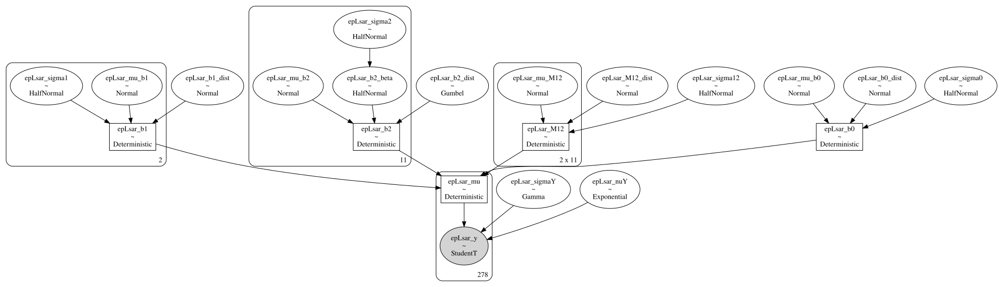

In [23]:
try:
    graph_epLsar = pm.model_to_graphviz(epLsarModel)    
except:
    graph_epLsar = "Could not make graph"
graph_epLsar

#### Check prior choice

In [24]:
with epLsarModel as model:
    prior_pred_epLsar = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

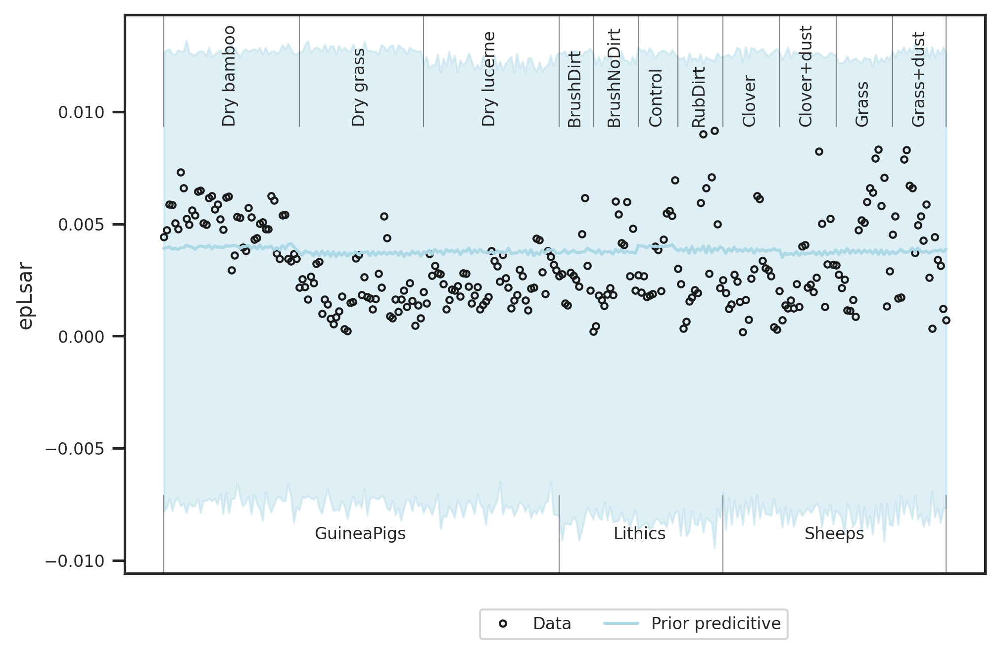

In [26]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                 prior_pred_epLsar,dataZ.epLsar_z.values,'epLsar',prefix)

Prior choice is as intended: Broad over the data range.

#### Sampling

In [27]:
with epLsarModel as model:
    trace_epLsar = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=0.99,random_seed=random_seed)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [epLsar_M12_dist, epLsar_mu_M12, epLsar_b2_dist, epLsar_b2_beta, epLsar_b1_dist, epLsar_b0_dist, epLsar_sigmaY, epLsar_nuY, epLsar_sigma12, epLsar_mu_b2, epLsar_mu_b1, epLsar_mu_b0, epLsar_sigma2, epLsar_sigma1, epLsar_sigma0]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 178 seconds.


In [28]:
with epLsarModel as model:
    if writeOut:
        with open(outPathData + '{}_model_{}.pkl'.format(prefix,'epLsar'), 'wb') as buff:
            pickle.dump({'model':epLsarModel, 'trace': trace_epLsar}, buff)            

##### Save for later comparison

In [29]:
if writeOut:
    np.save('../derived_data/statistical_model_two_factors_filter_weak/statistical_model_two_factors_filter_weak_epLsar_oldb1', trace_epLsar['epLsar_b1'])
    np.save('../derived_data/statistical_model_two_factors_filter_weak/statistical_model_two_factors_filter_weak_epLsar_oldb2', trace_epLsar['epLsar_b2'])
    np.save('../derived_data/statistical_model_two_factors_filter_weak/statistical_model_two_factors_filter_weak_epLsar_oldM12', trace_epLsar['epLsar_M12'])

#### Check sampling

In [30]:
with epLsarModel as model:
    dataTrace_epLsar = az.from_pymc3(trace=trace_epLsar)

In [31]:
pm.summary(dataTrace_epLsar,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
epLsar_mu_b0,-0.05,0.82,-1.65,1.54,0.01,0.02,6470.0,1562.0,6473.0,2593.0,1.0
epLsar_mu_b1[0],0.04,0.73,-1.46,1.38,0.01,0.01,5416.0,1540.0,5398.0,2587.0,1.0
epLsar_mu_b1[1],-0.07,0.74,-1.55,1.36,0.01,0.01,5127.0,1465.0,5139.0,2939.0,1.0
epLsar_mu_b2[0],-0.15,0.66,-1.45,1.12,0.01,0.01,6447.0,2150.0,6450.0,3472.0,1.0
epLsar_mu_b2[1],-0.12,0.69,-1.52,1.18,0.01,0.01,5453.0,2235.0,5448.0,2856.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
epLsar_mu[273],0.45,0.28,-0.11,0.98,0.00,0.00,3996.0,3777.0,4001.0,3551.0,1.0
epLsar_mu[274],0.47,0.32,-0.13,1.13,0.00,0.00,4040.0,3810.0,4033.0,3712.0,1.0
epLsar_mu[275],0.45,0.28,-0.11,0.98,0.00,0.00,3996.0,3777.0,4001.0,3551.0,1.0
epLsar_mu[276],0.47,0.32,-0.13,1.13,0.00,0.00,4040.0,3810.0,4033.0,3712.0,1.0


/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/pairplot.py:216: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  UserWarning,


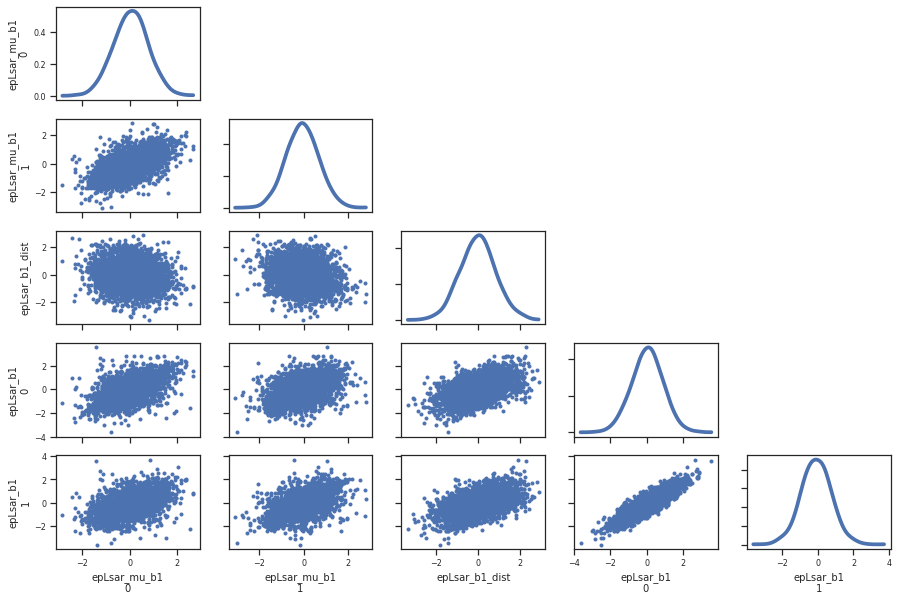

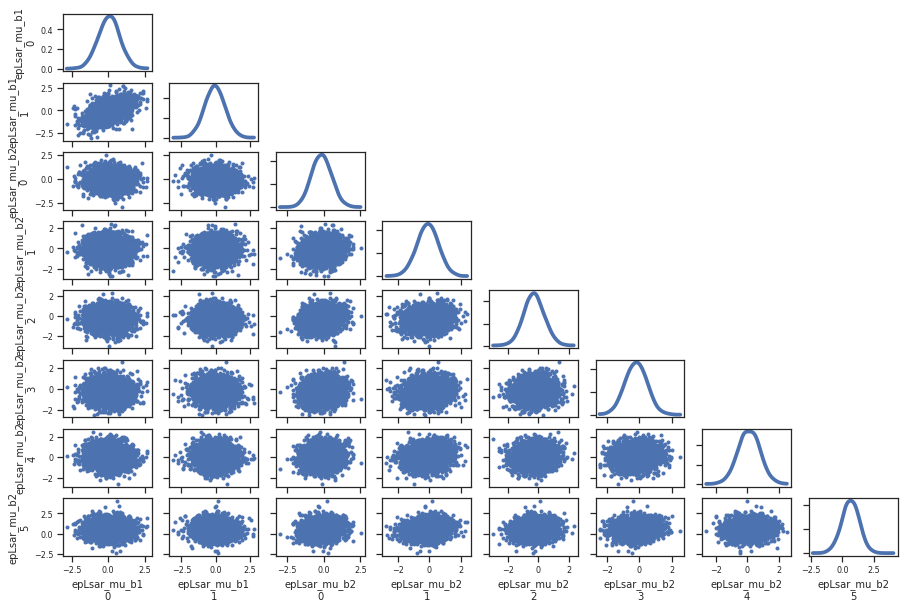

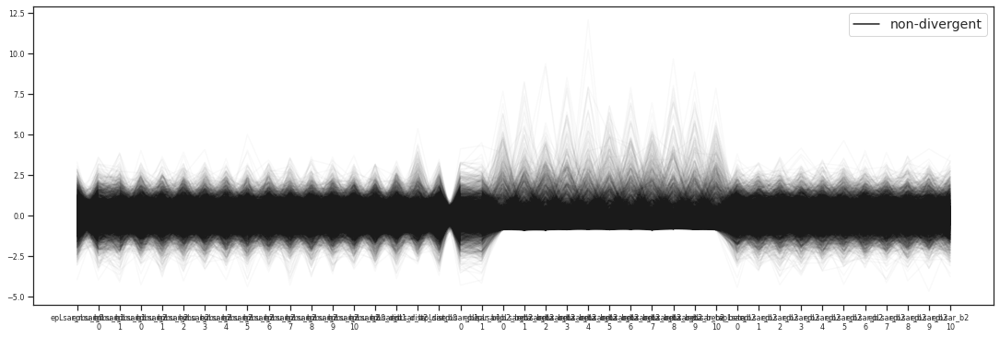

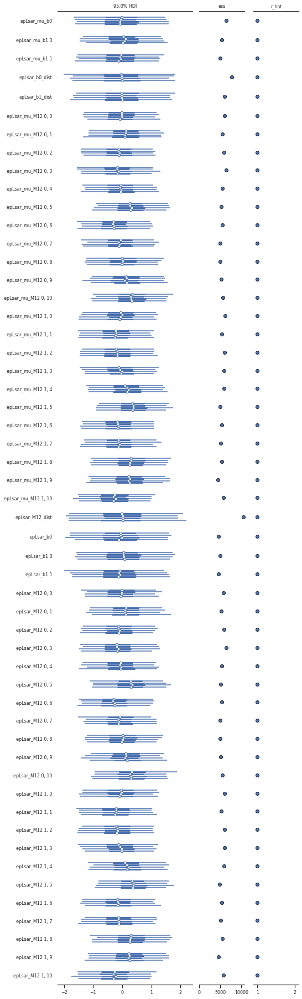

In [32]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_epLsar,dataTrace_epLsar,\
                             'epLsar',prefix)

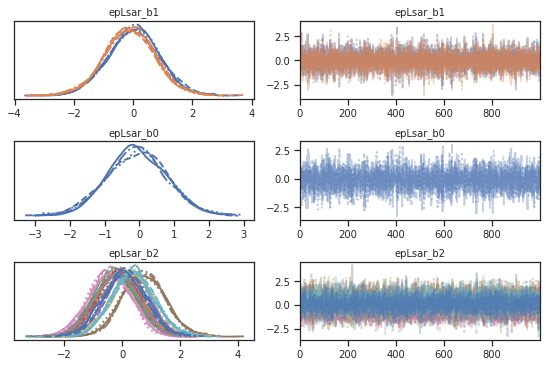

In [33]:
with epLsarModel as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_epLsar,'epLsar',prefix)

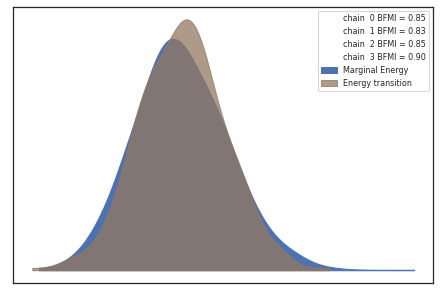

In [34]:
with epLsarModel as model:
    plotting_lib.pm.energyplot(trace_epLsar)

#### Posterior predictive distribution

In [35]:
with epLsarModel as model:
    posterior_pred_epLsar = pm.sample_posterior_predictive(trace_epLsar,samples=numPredSamples,random_seed=random_seed)

/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/pymc3/sampling.py:1708: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


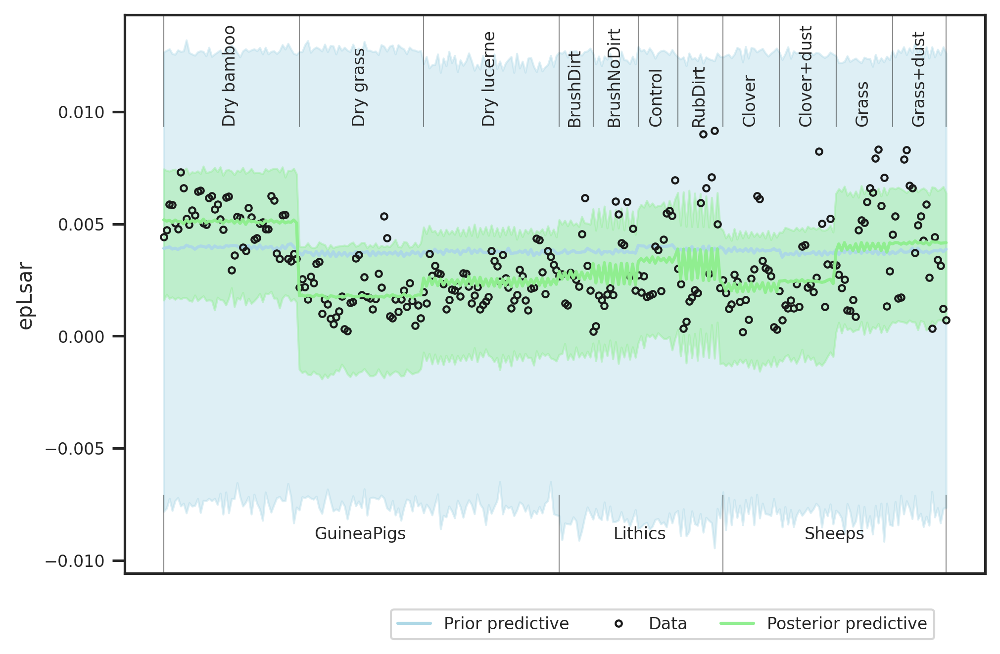

In [36]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                          prior_pred_epLsar,posterior_pred_epLsar,dataZ.epLsar_z.values,\
                                          'epLsar',prefix)

#### Compare prior and posterior for model parameters

In [37]:
with epLsarModel as model:
    pm_data_epLsar = az.from_pymc3(trace=trace_epLsar,prior=prior_pred_epLsar,posterior_predictive=posterior_pred_epLsar)

arviz.data.io_pymc3 - WARNING - posterior predictive variable epLsar_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


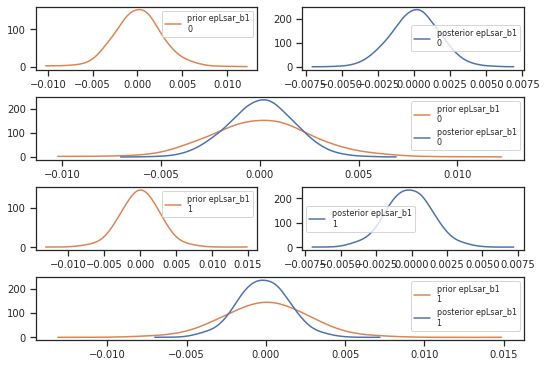

In [38]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                 pm_data_epLsar,'epLsar',prefix)

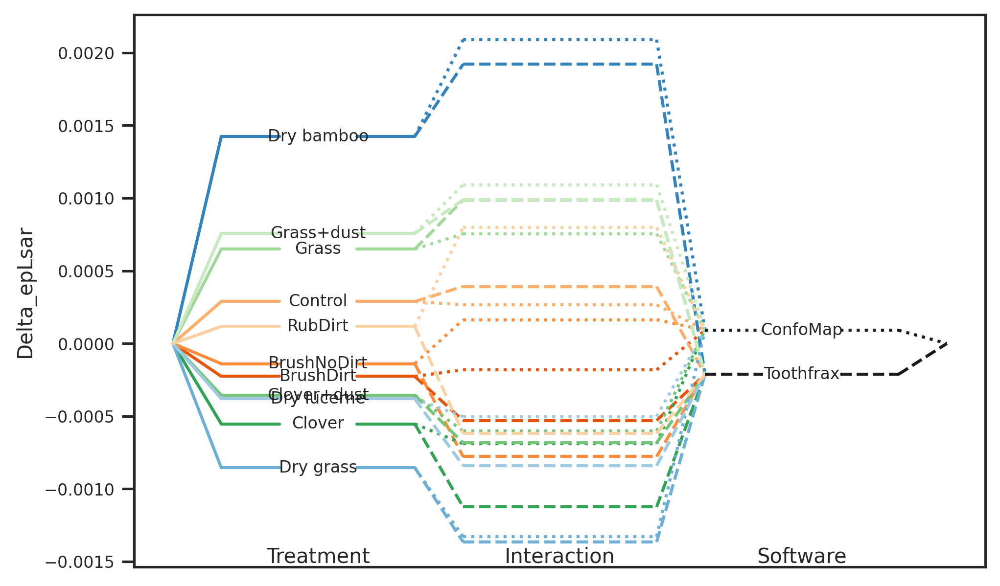

In [39]:
plotting_lib.plotLevels(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,dictTreatment,\
                        dictSoftware,trace_epLsar,'epLsar',x1,x2)

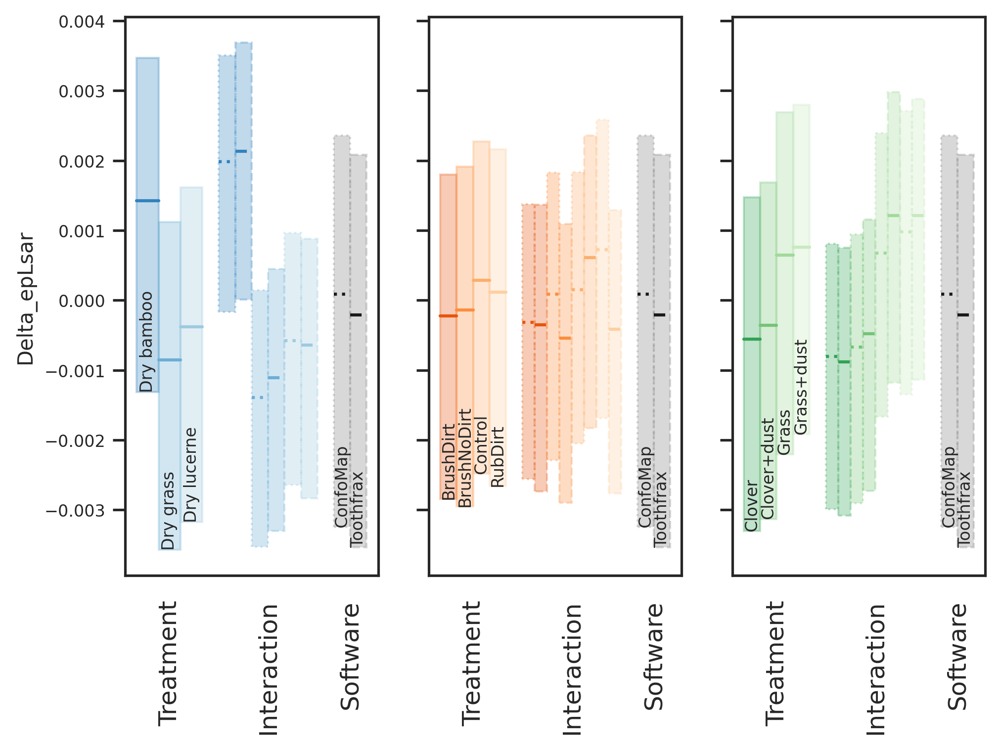

In [40]:
plotting_lib.plotLevelsStd(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,dictTreatment,\
                           dictSoftware,trace_epLsar,'epLsar',x1,x2)

#### Posterior and contrasts

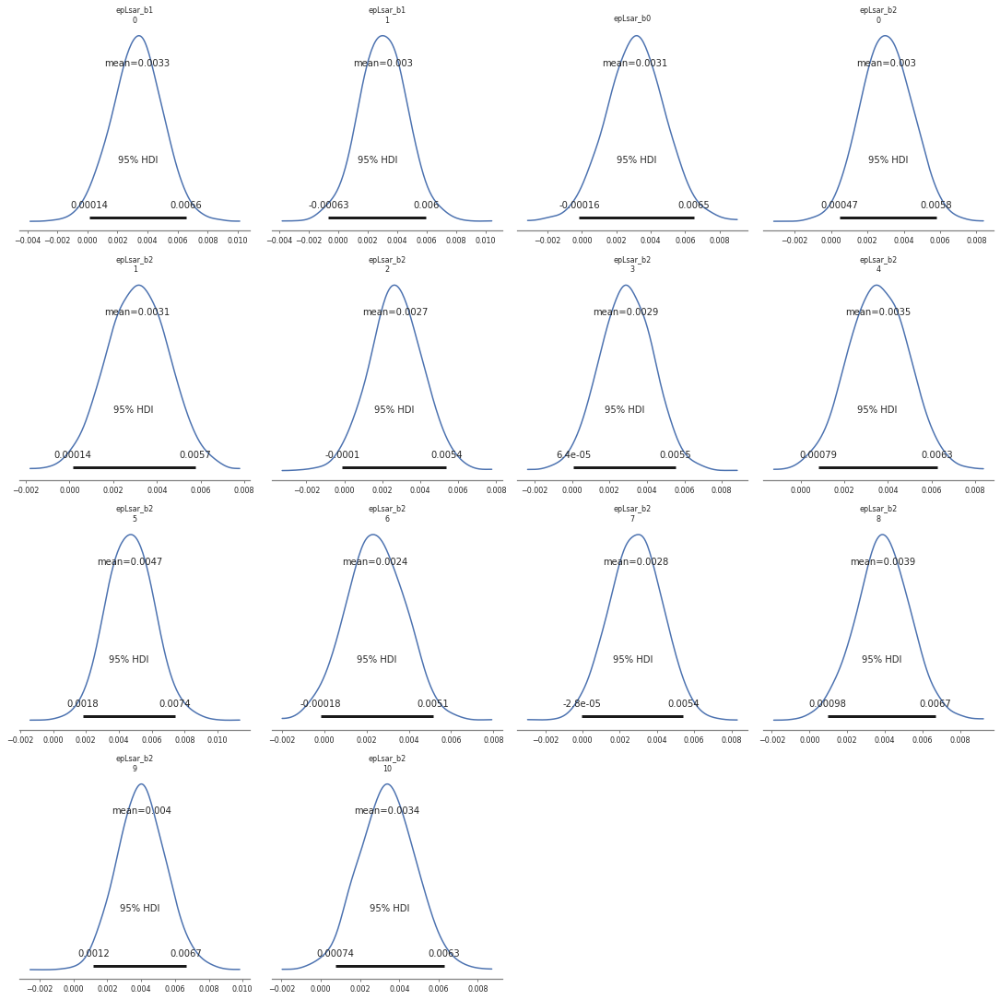

In [41]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_epLsar,'epLsar',prefix)

In [42]:
df_hdi_epLsar = plotting_lib.plotTreatmentPosterior(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,\
                                                    dictMeanStd,dictTreatment,dictSoftware,trace_epLsar,\
                                                    'epLsar',x1,x2,prefix)

In [43]:
df_hdi_epLsar

,Treatment_i,Treatment_j,hdi_ConfoMap_2.5%,hdi_ConfoMap_97.5%,isSignificant_on_ConfoMap,hdi_Toothfrax_2.5%,hdi_Toothfrax_97.5%,isSignificant_on_Toothfrax
0,Dry grass,Dry bamboo,-0.004152,-0.002594,True,-0.003996,-0.002397,True
1,Dry lucerne,Dry bamboo,-0.003326,-0.001788,True,-0.003509,-0.002022,True
2,Dry lucerne,Dry grass,0.000057,0.001571,True,-0.000323,0.001235,False
3,BrushNoDirt,BrushDirt,-0.001377,0.002078,False,-0.001797,0.001283,False
4,Control,BrushDirt,-0.001051,0.002062,False,-0.000649,0.002677,False
5,Control,BrushNoDirt,-0.001703,0.001898,False,-0.000599,0.002795,False
6,RubDirt,BrushDirt,-0.000716,0.002956,False,-0.001682,0.001413,False
7,RubDirt,BrushNoDirt,-0.001393,0.002726,False,-0.001327,0.001686,False
8,RubDirt,Control,-0.001339,0.002509,False,-0.002646,0.000660,False
9,Clover+dust,Clover,-0.001123,0.001394,False,-0.000920,0.001698,False


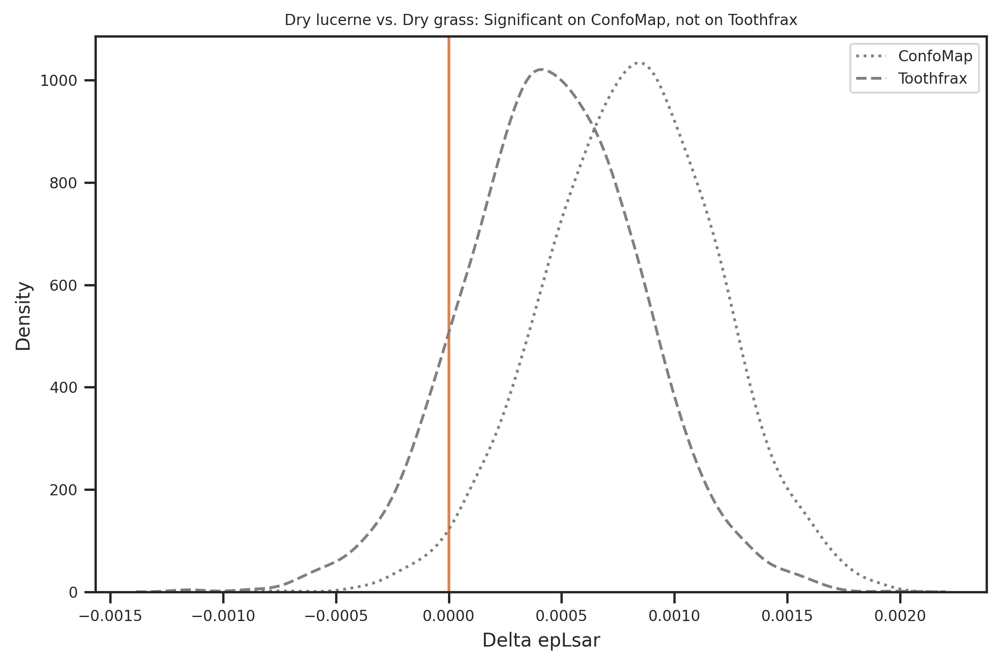

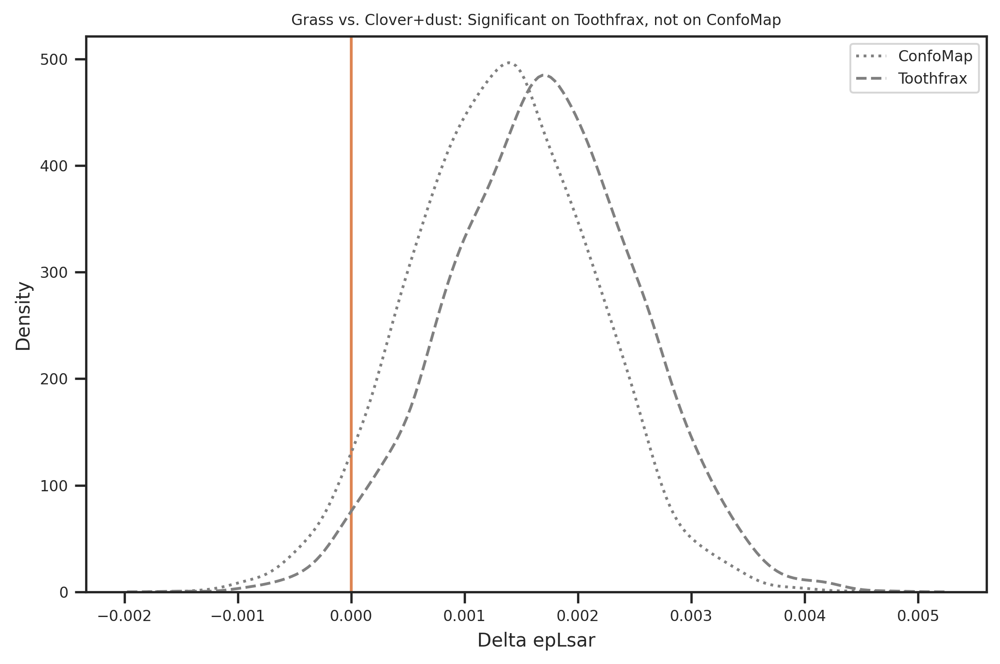

In [44]:
plotting_lib.plotTreatmentPosteriorDiff(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                        dictTreatment,dictSoftware,trace_epLsar,'epLsar',x1,x2,prefix)

In [45]:
if writeOut:
    df_hdi_epLsar.to_csv(outPathData+ '{}_hdi_{}.csv'.format(prefix,'epLsar'))

### R²<a name="r"></a>

In [46]:
with pm.Model() as model:
    RsquaredModel = TwoFactorModel('Rsquared',x1,x2,dataZ["Rsquared_z"].values)

#### Verify model settings

In [47]:
RsquaredModel.printParams(x1,x2,dataZ["Rsquared_z"].values)

The number of levels of the x variables are (2, 11)
The standard deviations used for the beta priors are  (1.364226512794052, 3.833663350609328)
The standard deviations used for the M12 priors are 0.20345815702507086


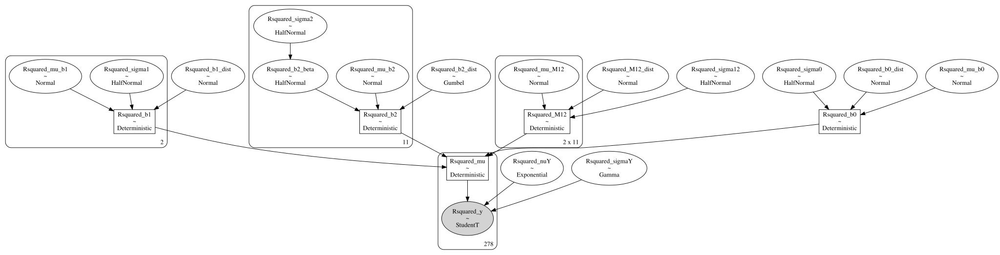

In [48]:
pm.model_to_graphviz(RsquaredModel)

#### Check prior choice

In [49]:
with RsquaredModel as model:
    prior_pred_Rsquared = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

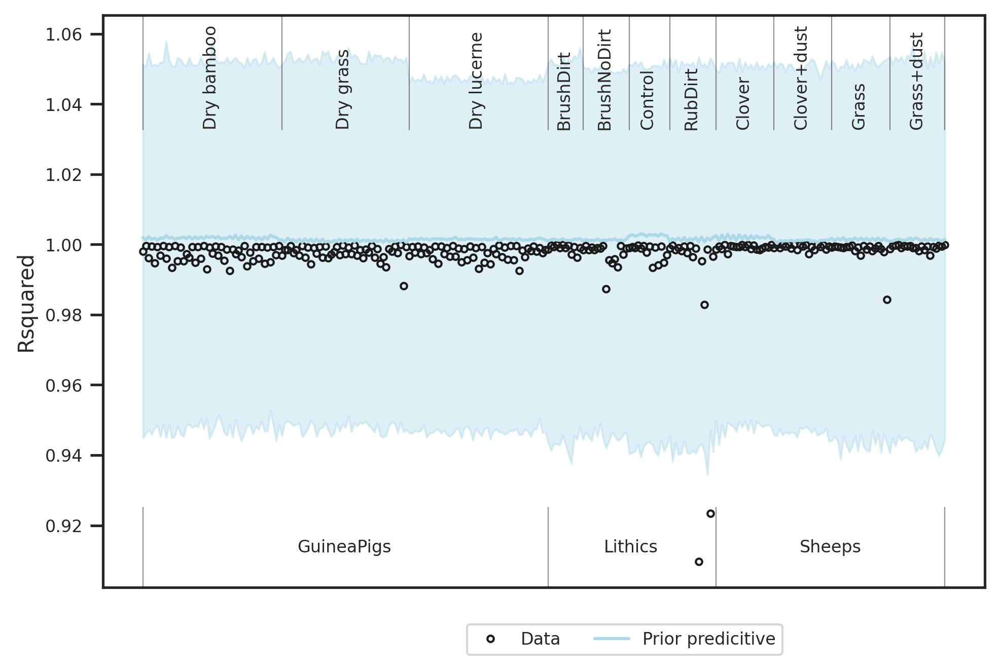

In [50]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                 prior_pred_Rsquared,dataZ["Rsquared_z"].values,'Rsquared',prefix)

#### Sampling

In [51]:
with RsquaredModel as model:
    trace_Rsquared = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=0.99,random_seed=random_seed)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Rsquared_M12_dist, Rsquared_mu_M12, Rsquared_b2_dist, Rsquared_b2_beta, Rsquared_b1_dist, Rsquared_b0_dist, Rsquared_sigmaY, Rsquared_nuY, Rsquared_sigma12, Rsquared_mu_b2, Rsquared_mu_b1, Rsquared_mu_b0, Rsquared_sigma2, Rsquared_sigma1, Rsquared_sigma0]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1625 seconds.


In [52]:
with RsquaredModel as model:
    if writeOut:
        with open(outPathData + '{}_model_{}.pkl'.format(prefix,'Rsquared'), 'wb') as buff:
            pickle.dump({'model': RsquaredModel, 'trace': trace_Rsquared}, buff)

#### Check sampling

In [53]:
with RsquaredModel as model:
    dataTrace_Rsquared = az.from_pymc3(trace=trace_Rsquared)

In [54]:
pm.summary(dataTrace_Rsquared,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
Rsquared_mu_b0,0.09,0.83,-1.56,1.69,0.01,0.01,5090.0,2109.0,5099.0,2890.0,1.0
Rsquared_mu_b1[0],-0.06,0.74,-1.53,1.34,0.01,0.01,3681.0,2539.0,3669.0,3353.0,1.0
Rsquared_mu_b1[1],0.10,0.72,-1.36,1.46,0.01,0.01,4328.0,2934.0,4336.0,3441.0,1.0
Rsquared_mu_b2[0],0.05,0.67,-1.25,1.34,0.01,0.01,3253.0,2383.0,3270.0,3303.0,1.0
Rsquared_mu_b2[1],0.02,0.67,-1.31,1.26,0.01,0.01,3147.0,2682.0,3155.0,2829.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
Rsquared_mu[273],0.30,0.02,0.26,0.33,0.00,0.00,4108.0,4092.0,4103.0,3710.0,1.0
Rsquared_mu[274],0.22,0.03,0.16,0.27,0.00,0.00,4006.0,3960.0,4006.0,3711.0,1.0
Rsquared_mu[275],0.30,0.02,0.26,0.33,0.00,0.00,4108.0,4092.0,4103.0,3710.0,1.0
Rsquared_mu[276],0.22,0.03,0.16,0.27,0.00,0.00,4006.0,3960.0,4006.0,3711.0,1.0


/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/pairplot.py:216: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  UserWarning,


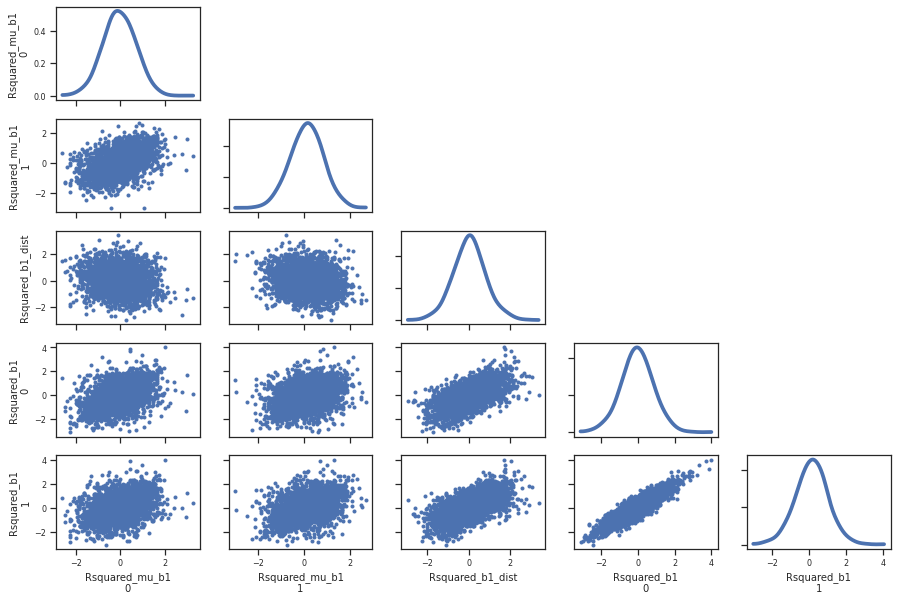

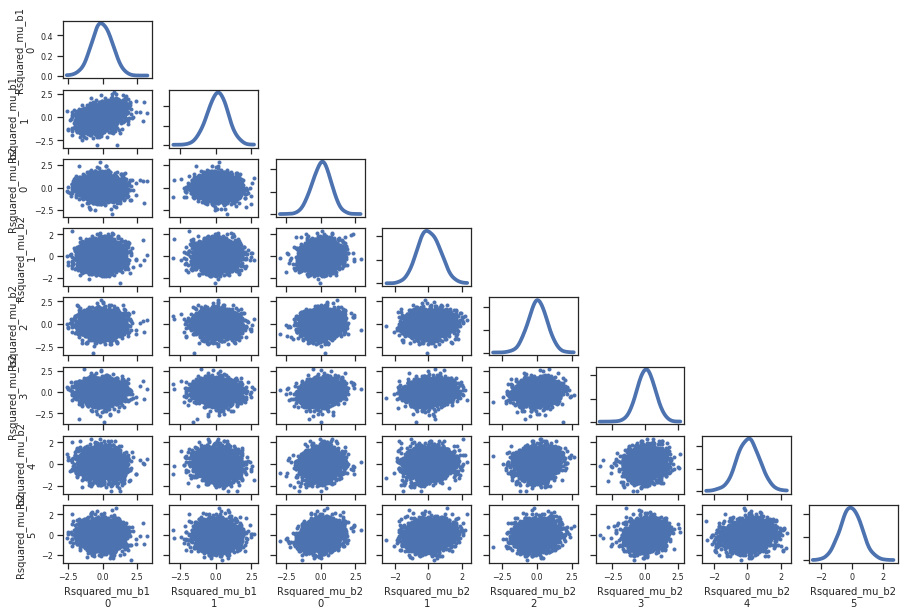

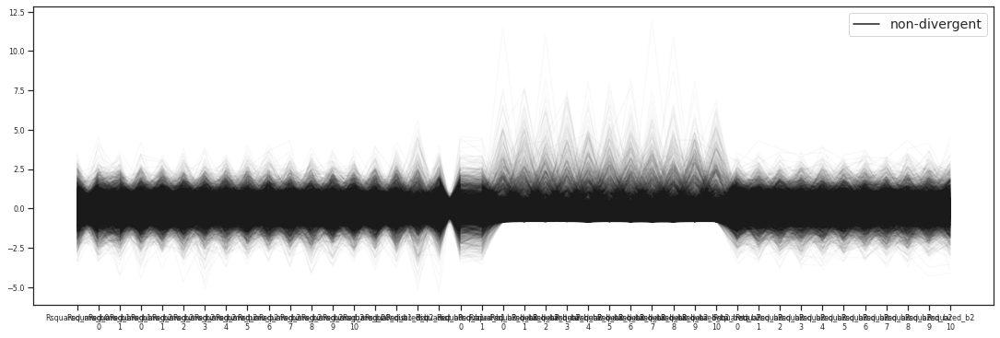

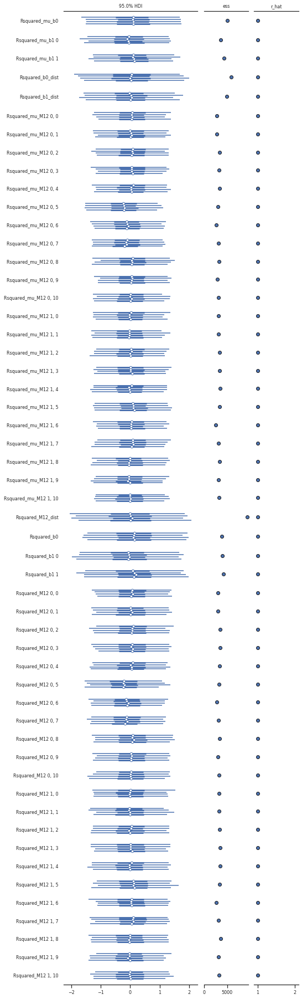

In [55]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_Rsquared,\
                             dataTrace_Rsquared,'Rsquared',prefix)

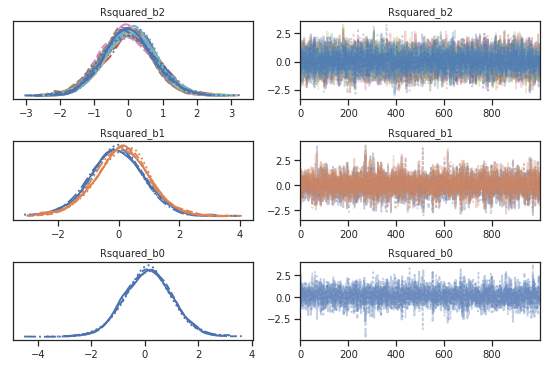

In [56]:
with RsquaredModel as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_Rsquared,'Rsquared',prefix)

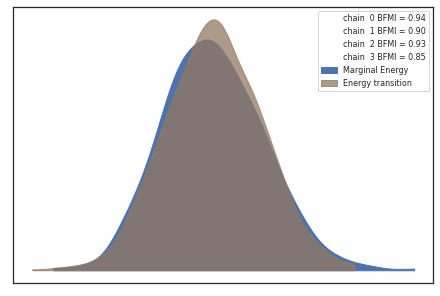

In [57]:
with RsquaredModel as model:
    plotting_lib.pm.energyplot(trace_Rsquared)

#### Posterior predictive distribution

In [58]:
with RsquaredModel as model:
    posterior_pred_Rsquared = pm.sample_posterior_predictive(trace_Rsquared,samples=numPredSamples,random_seed=random_seed)

/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/pymc3/sampling.py:1708: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


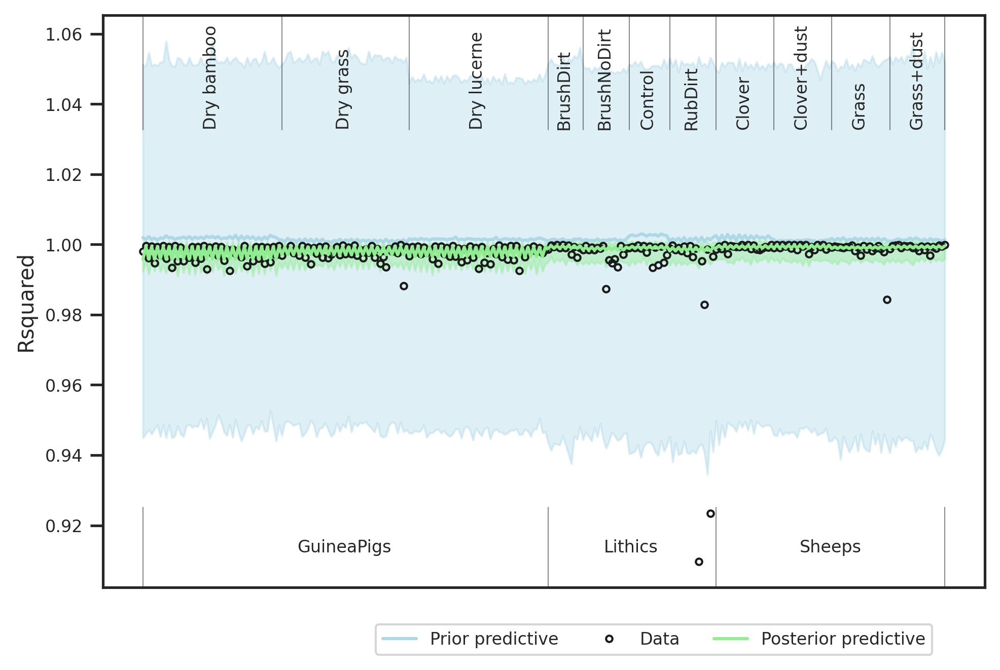

In [59]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                          prior_pred_Rsquared,posterior_pred_Rsquared,\
                                          dataZ["Rsquared_z"].values,'Rsquared',prefix)

#### Compare prior and posterior for model parameters

In [60]:
with RsquaredModel as model:
    pm_data_Rsquared = az.from_pymc3(trace=trace_Rsquared,prior=prior_pred_Rsquared,posterior_predictive=posterior_pred_Rsquared)

arviz.data.io_pymc3 - WARNING - posterior predictive variable Rsquared_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


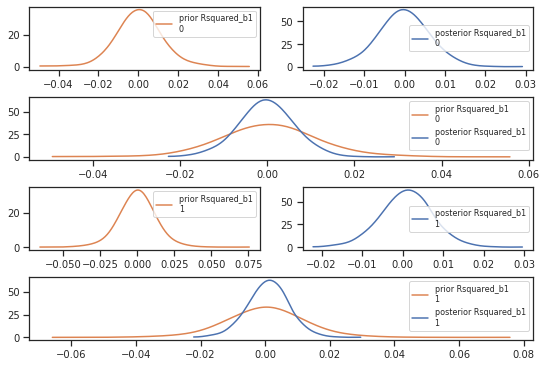

In [61]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                 pm_data_Rsquared,'Rsquared',prefix)

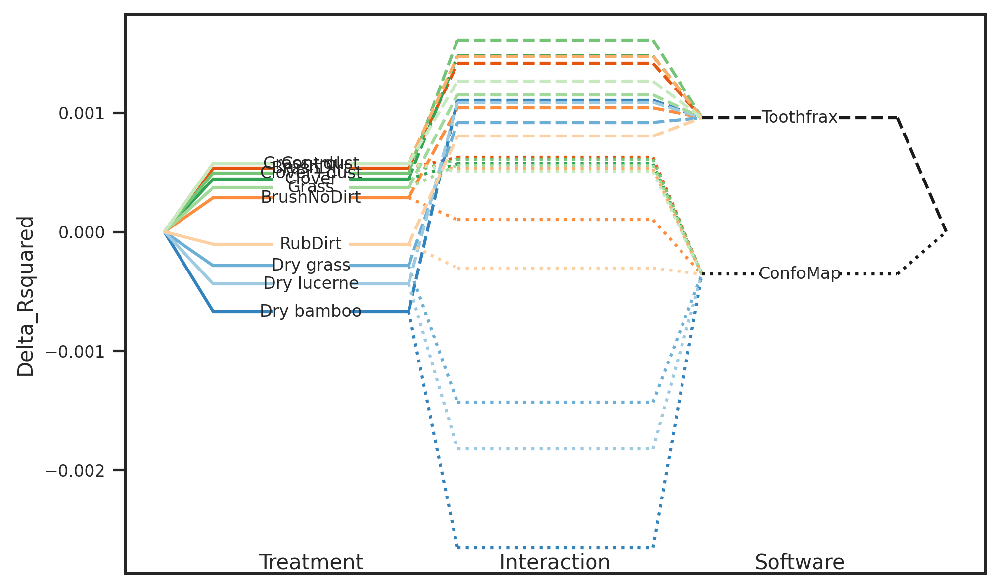

In [62]:
plotting_lib.plotLevels(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                        dictTreatment,dictSoftware,trace_Rsquared,'Rsquared',x1,x2)

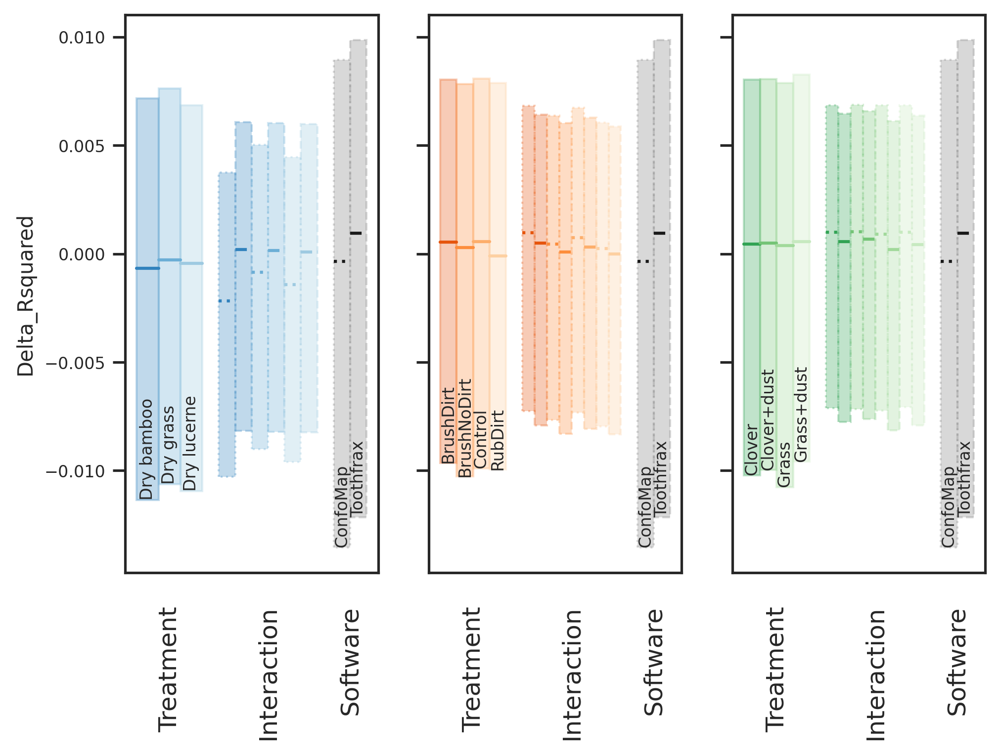

In [63]:
plotting_lib.plotLevelsStd(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                           dictTreatment,dictSoftware,trace_Rsquared,'Rsquared',x1,x2)

#### Posterior and contrasts

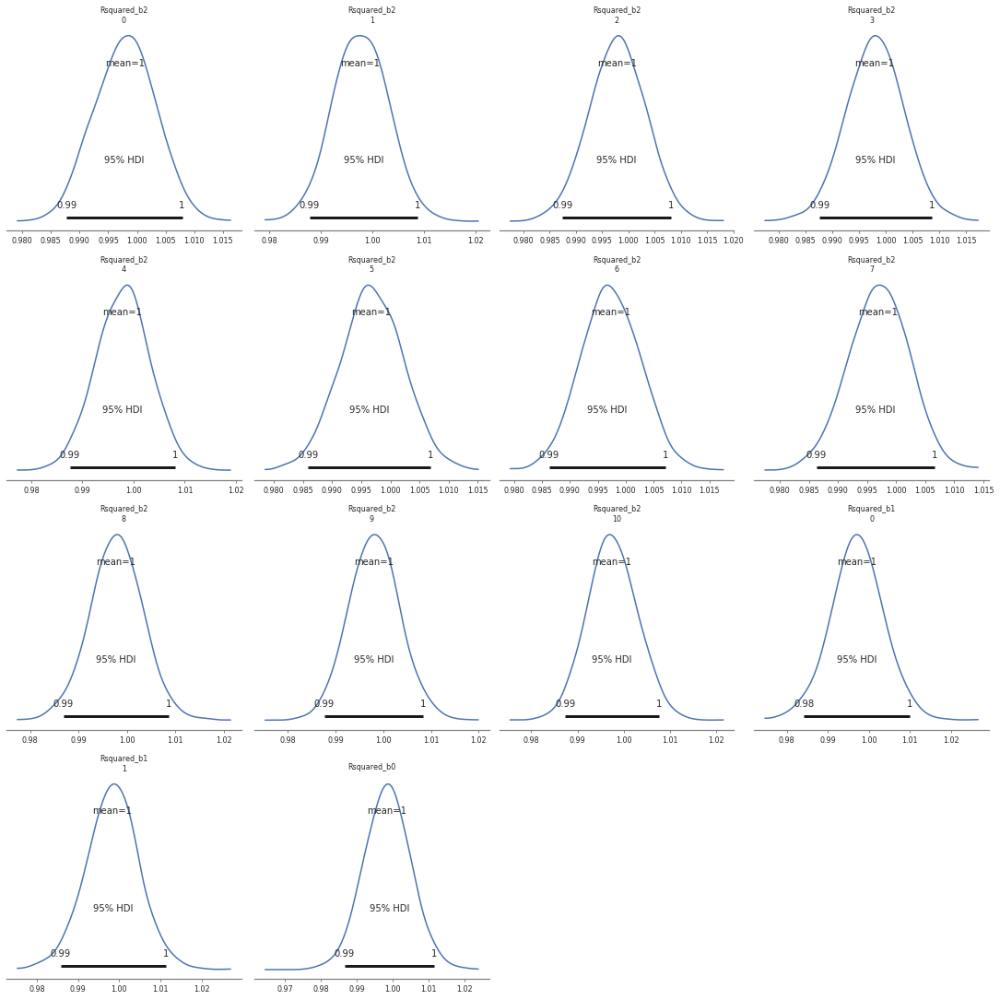

In [64]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,\
                           pm_data_Rsquared,'Rsquared',prefix)

In [65]:
df_hdi_R = plotting_lib.plotTreatmentPosterior(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                               dictTreatment,dictSoftware,trace_Rsquared,'Rsquared',x1,x2,prefix)

In [66]:
df_hdi_R

,Treatment_i,Treatment_j,hdi_ConfoMap_2.5%,hdi_ConfoMap_97.5%,isSignificant_on_ConfoMap,hdi_Toothfrax_2.5%,hdi_Toothfrax_97.5%,isSignificant_on_Toothfrax
0,Dry grass,Dry bamboo,0.000659,0.001970,True,-0.000351,0.000253,False
1,Dry lucerne,Dry bamboo,0.000067,0.001447,True,-0.000407,0.000144,False
2,Dry lucerne,Dry grass,-0.001082,0.000049,False,-0.000384,0.000276,False
3,BrushNoDirt,BrushDirt,-0.001244,0.000215,False,-0.000965,0.000147,False
4,Control,BrushDirt,-0.001290,0.000753,False,-0.000634,0.000352,False
5,Control,BrushNoDirt,-0.000712,0.001349,False,-0.000288,0.000781,False
6,RubDirt,BrushDirt,-0.001629,0.000051,False,-0.001153,0.000118,False
7,RubDirt,BrushNoDirt,-0.001106,0.000574,False,-0.000755,0.000541,False
8,RubDirt,Control,-0.001619,0.000571,False,-0.000955,0.000241,False
9,Clover+dust,Clover,-0.000472,0.000480,False,-0.000234,0.000504,False


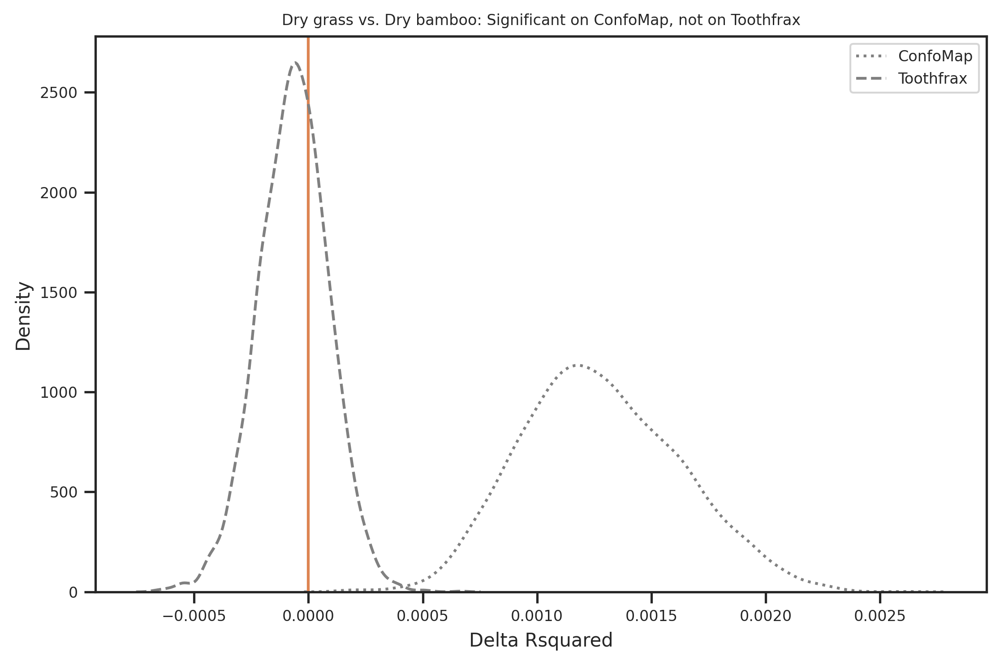

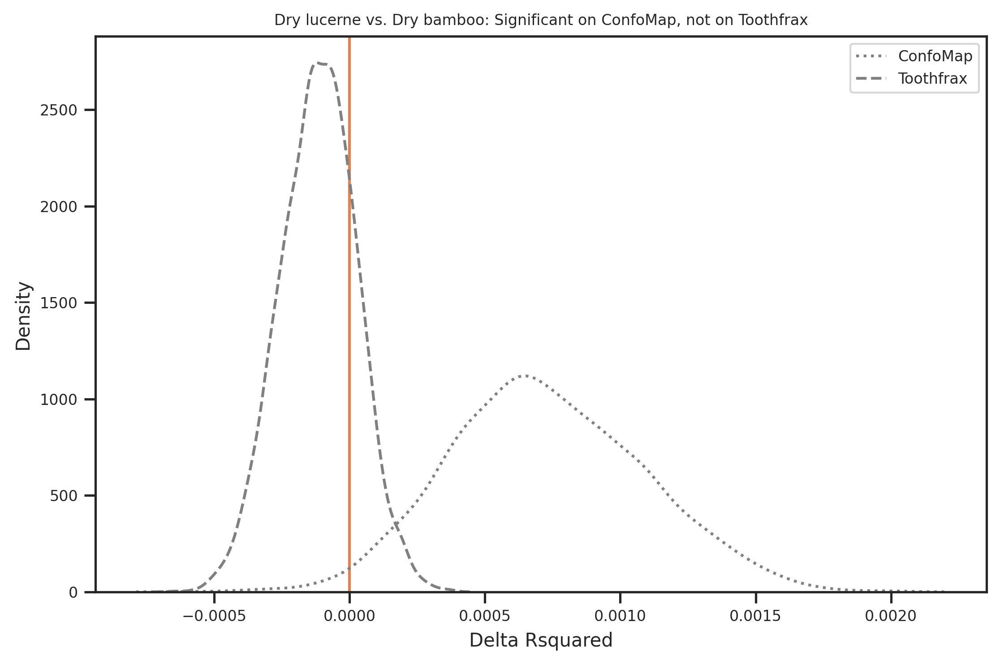

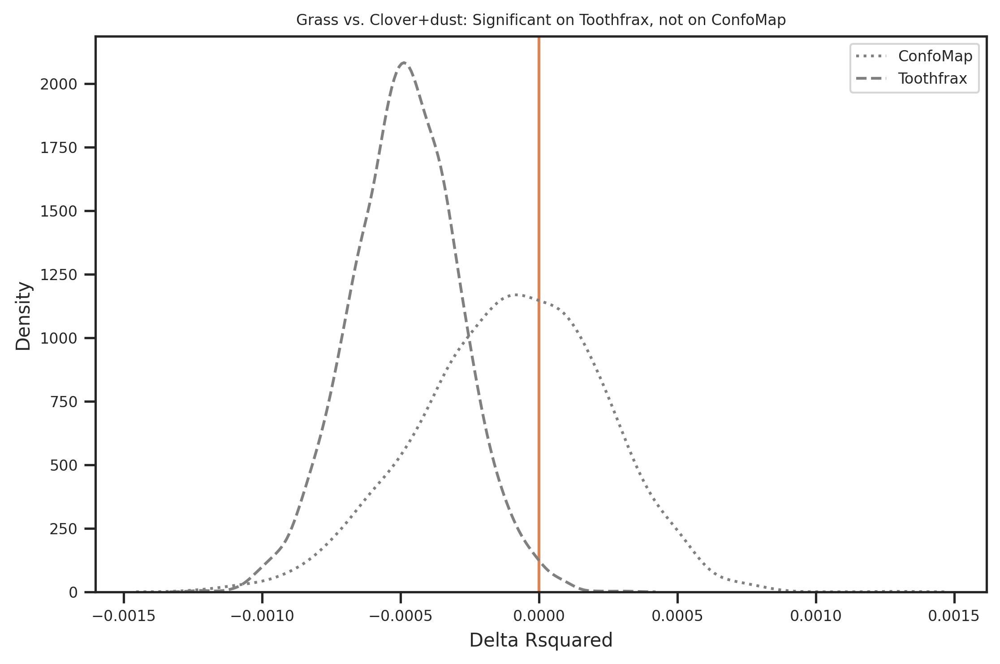

In [67]:
plotting_lib.plotTreatmentPosteriorDiff(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                        dictTreatment,dictSoftware,trace_Rsquared,'Rsquared',x1,x2,prefix)

In [68]:
if writeOut:
    df_hdi_R.to_csv(outPathData+ '{}_hdi_{}.csv'.format(prefix,'Rsquared'))

### Asfc  <a name="Asfc"></a>

In [69]:
with pm.Model() as model:
    AsfcModel = TwoFactorModel('Asfc',x1,x2,dataZ["Asfc_z"].values)

#### Verify model settings

In [70]:
AsfcModel.printParams(x1,x2,dataZ["Asfc_z"].values)

The number of levels of the x variables are (2, 11)
The standard deviations used for the beta priors are  (1.0834504037573414, 1.7347208877727194)
The standard deviations used for the M12 priors are 0.10226340176080734


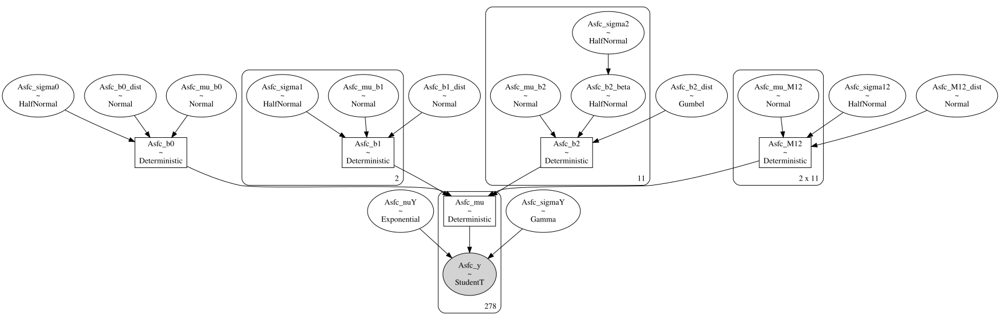

In [71]:
pm.model_to_graphviz(AsfcModel)

#### Check prior choice

In [72]:
with AsfcModel as model:
    prior_pred_Asfc = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

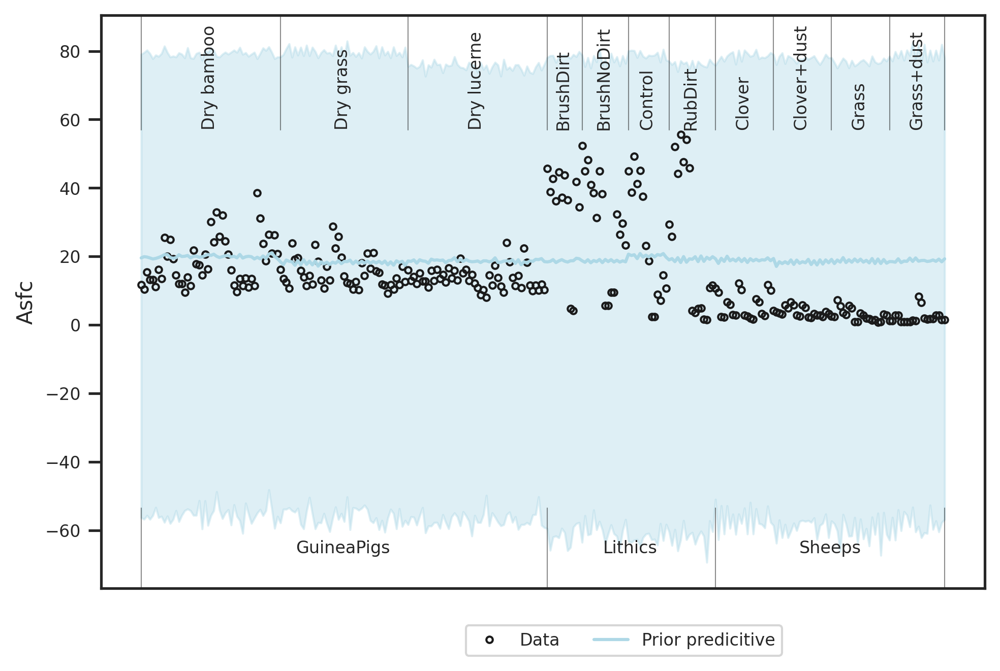

In [73]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                 prior_pred_Asfc,dataZ["Asfc_z"].values,'Asfc',prefix)

Prior choice is as intended: Broad over the data range.

#### Sampling

In [74]:
with AsfcModel as model:
    trace_Asfc = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=0.99,random_seed=random_seed)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Asfc_M12_dist, Asfc_mu_M12, Asfc_b2_dist, Asfc_b2_beta, Asfc_b1_dist, Asfc_b0_dist, Asfc_sigmaY, Asfc_nuY, Asfc_sigma12, Asfc_mu_b2, Asfc_mu_b1, Asfc_mu_b0, Asfc_sigma2, Asfc_sigma1, Asfc_sigma0]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 544 seconds.
The number of effective samples is smaller than 10% for some parameters.


In [75]:
with AsfcModel as model:
    if writeOut:
        with open(outPathData + '{}_model_{}.pkl'.format(prefix,'Asfc'), 'wb') as buff:
            pickle.dump({'model': AsfcModel, 'trace': trace_Asfc}, buff)

#### Check sampling

In [76]:
with AsfcModel as model:
    dataTrace_Asfc = az.from_pymc3(trace=trace_Asfc)

In [77]:
pm.summary(dataTrace_Asfc,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
Asfc_mu_b0,-0.06,0.81,-1.65,1.48,0.01,0.01,4064.0,2319.0,4058.0,3075.0,1.0
Asfc_mu_b1[0],0.07,0.73,-1.39,1.51,0.01,0.01,3340.0,2543.0,3338.0,2695.0,1.0
Asfc_mu_b1[1],-0.11,0.73,-1.50,1.32,0.01,0.01,3625.0,2612.0,3630.0,3292.0,1.0
Asfc_mu_b2[0],1.20,0.76,-0.26,2.66,0.02,0.01,2517.0,2517.0,2652.0,2405.0,1.0
Asfc_mu_b2[1],0.94,0.73,-0.42,2.39,0.01,0.01,3625.0,3328.0,3631.0,3427.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
Asfc_mu[273],-1.05,0.06,-1.17,-0.94,0.00,0.00,4027.0,4000.0,4022.0,3506.0,1.0
Asfc_mu[274],-1.05,0.06,-1.16,-0.92,0.00,0.00,4220.0,4220.0,4219.0,4065.0,1.0
Asfc_mu[275],-1.05,0.06,-1.17,-0.94,0.00,0.00,4027.0,4000.0,4022.0,3506.0,1.0
Asfc_mu[276],-1.05,0.06,-1.16,-0.92,0.00,0.00,4220.0,4220.0,4219.0,4065.0,1.0


/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/pairplot.py:216: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  UserWarning,


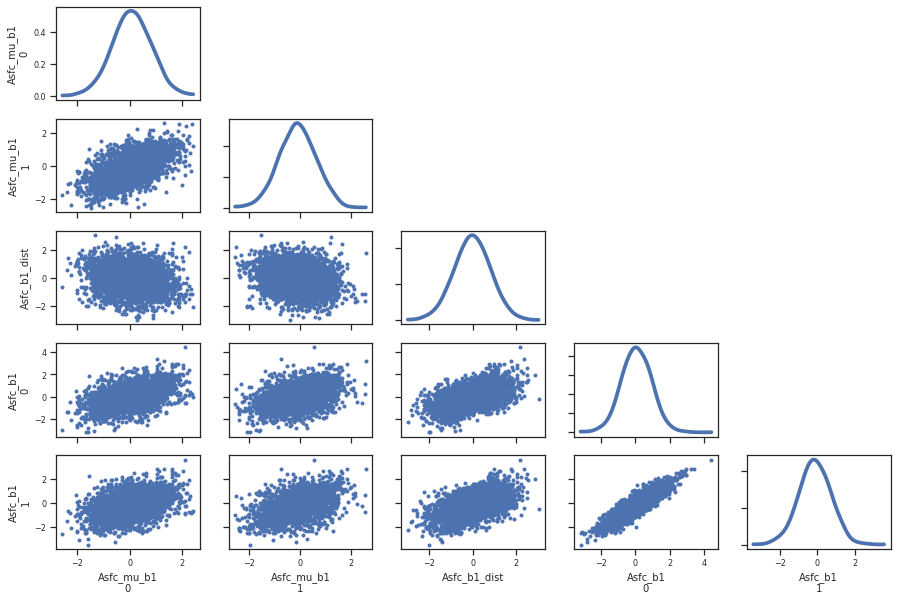

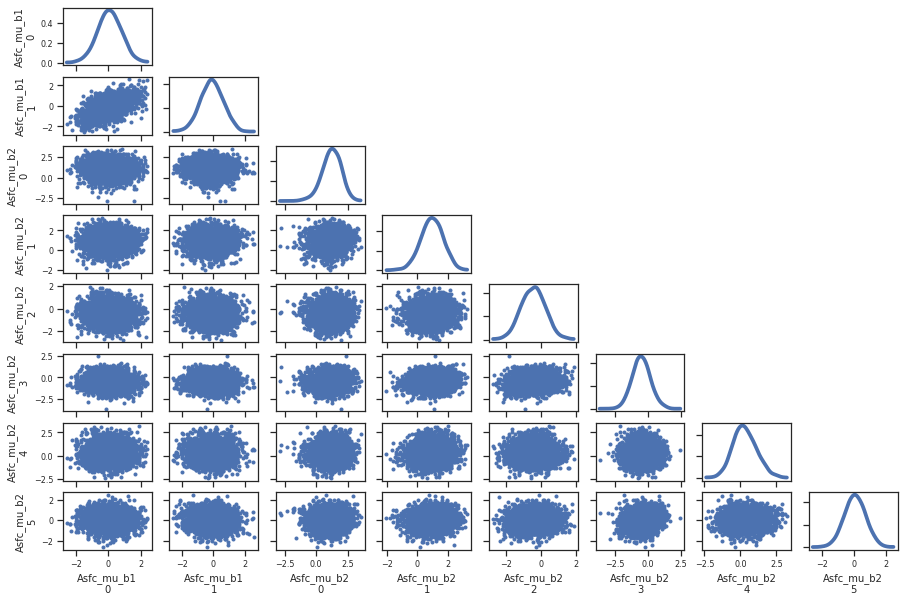

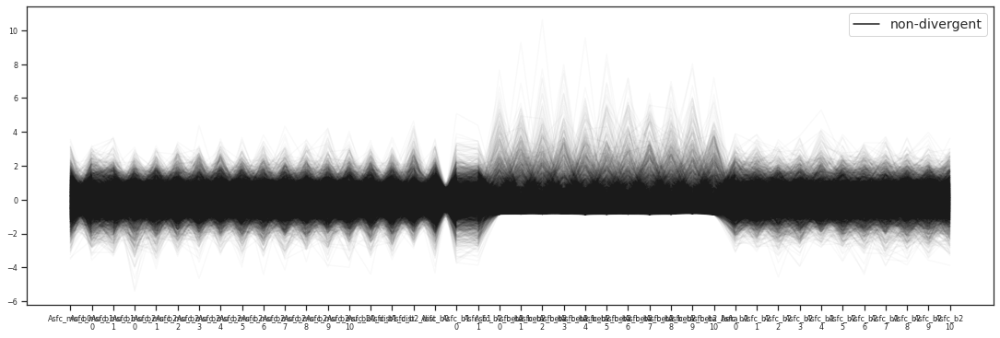

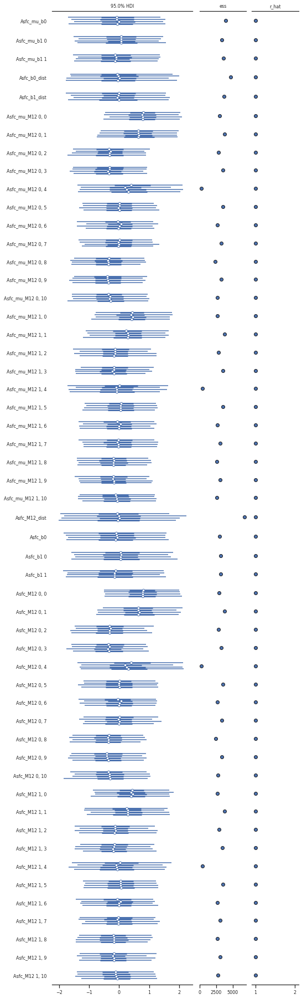

In [78]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_Asfc,dataTrace_Asfc,'Asfc',prefix)

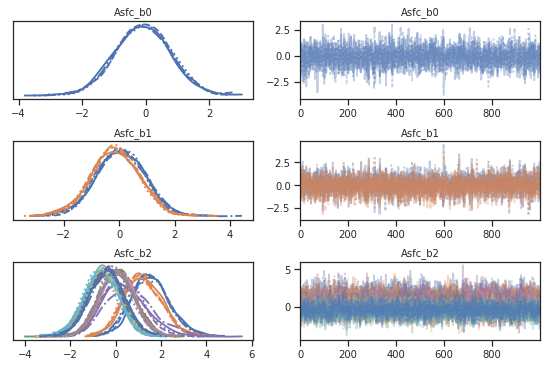

In [79]:
with AsfcModel as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_Asfc,'Asfc',prefix)

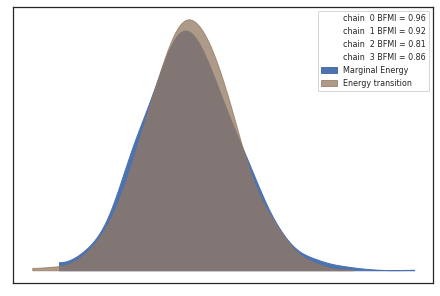

In [80]:
with AsfcModel as model:
    plotting_lib.pm.energyplot(trace_Asfc)

#### Posterior predictive distribution

In [81]:
with AsfcModel as model:
    posterior_pred_Asfc = pm.sample_posterior_predictive(trace_Asfc,samples=numPredSamples,random_seed=random_seed)

/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/pymc3/sampling.py:1708: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


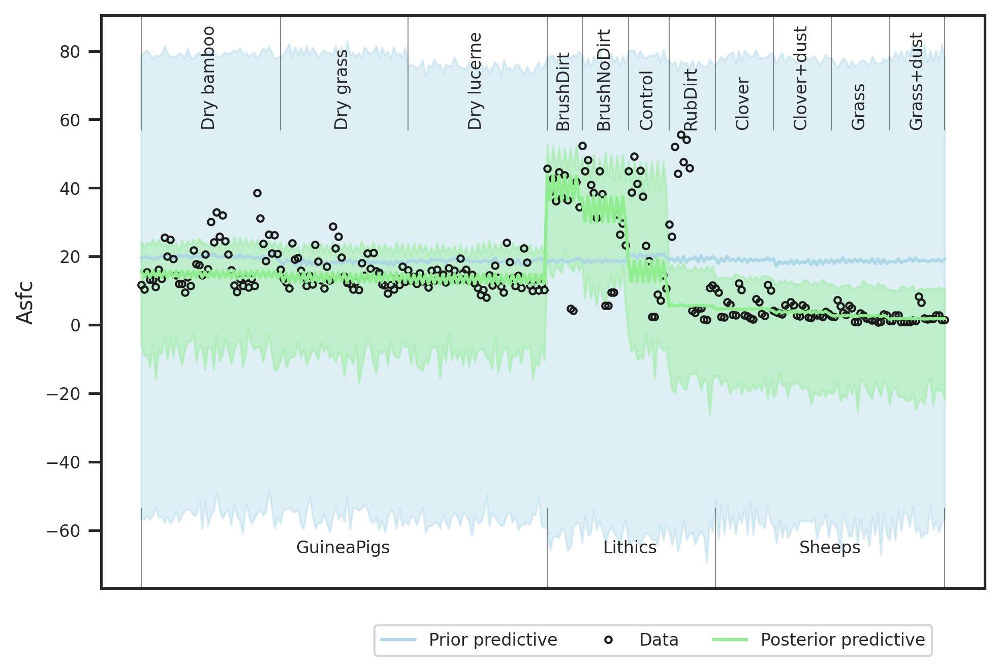

In [82]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,\
                                          dictMeanStd,prior_pred_Asfc,posterior_pred_Asfc,\
                                          dataZ["Asfc_z"].values,'Asfc',prefix)

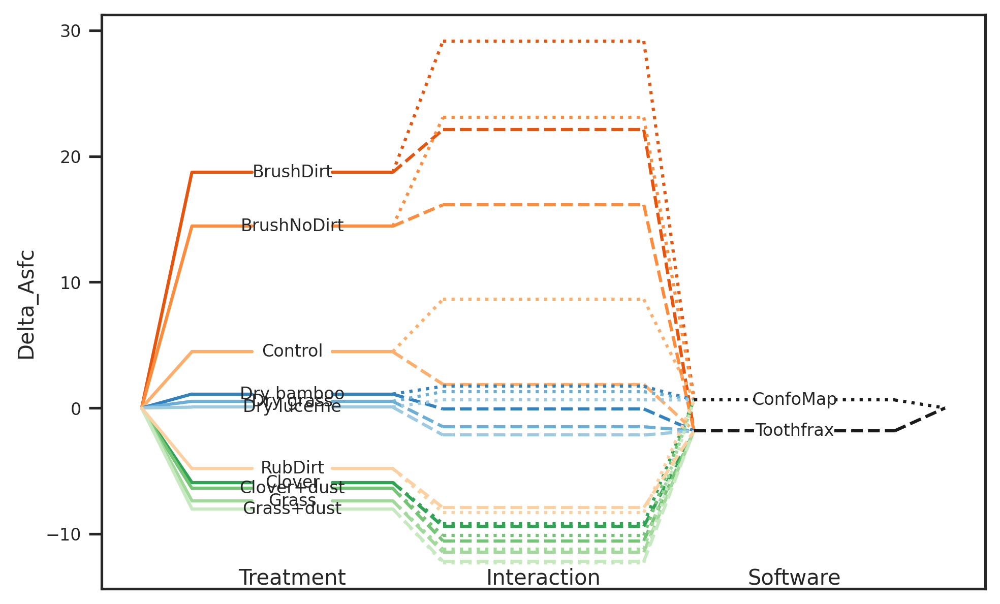

In [83]:
plotting_lib.plotLevels(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,dictTreatment,\
                        dictSoftware,trace_Asfc,'Asfc',x1,x2)

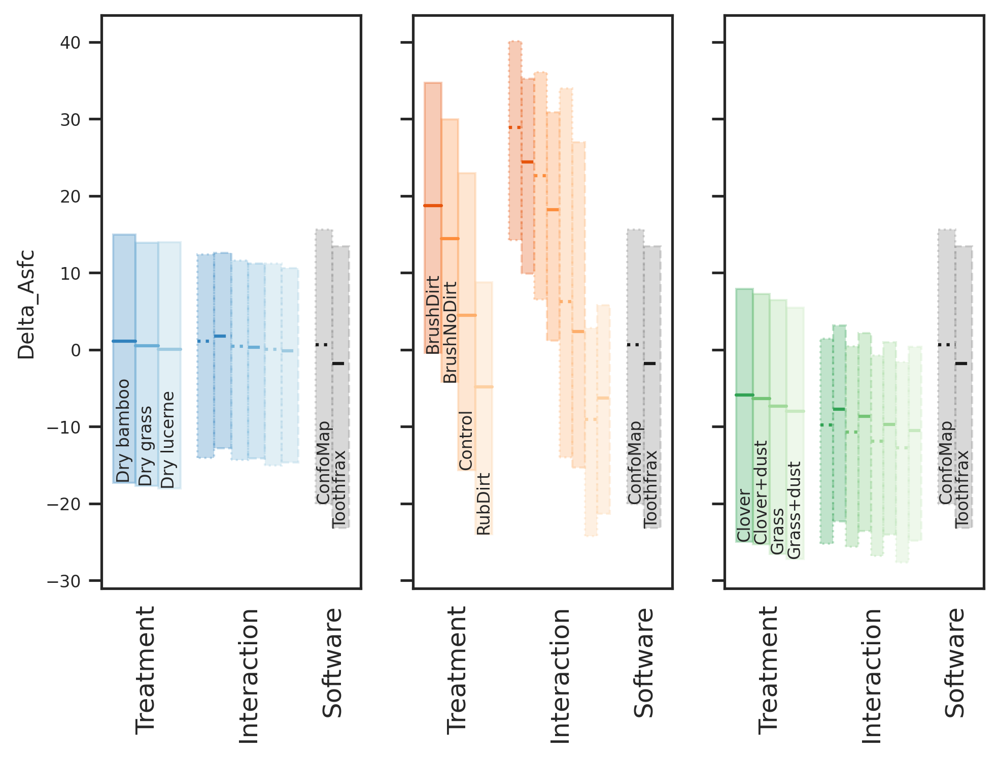

In [84]:
plotting_lib.plotLevelsStd(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,dictTreatment,\
                           dictSoftware,trace_Asfc,'Asfc',x1,x2)

#### Compare prior and posterior for model parameters

In [85]:
with AsfcModel as model:
    pm_data_Asfc = az.from_pymc3(trace=trace_Asfc,prior=prior_pred_Asfc,posterior_predictive=posterior_pred_Asfc)

arviz.data.io_pymc3 - WARNING - posterior predictive variable Asfc_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


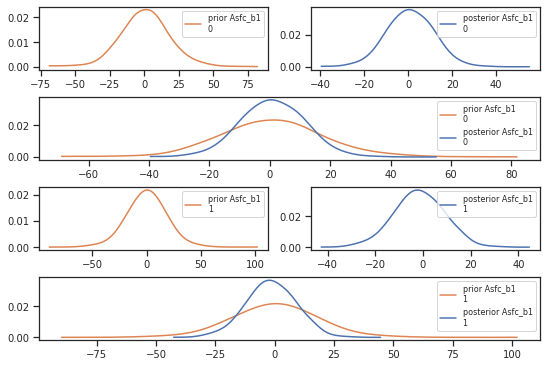

In [86]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                 pm_data_Asfc,'Asfc',prefix)

#### Posterior and contrasts

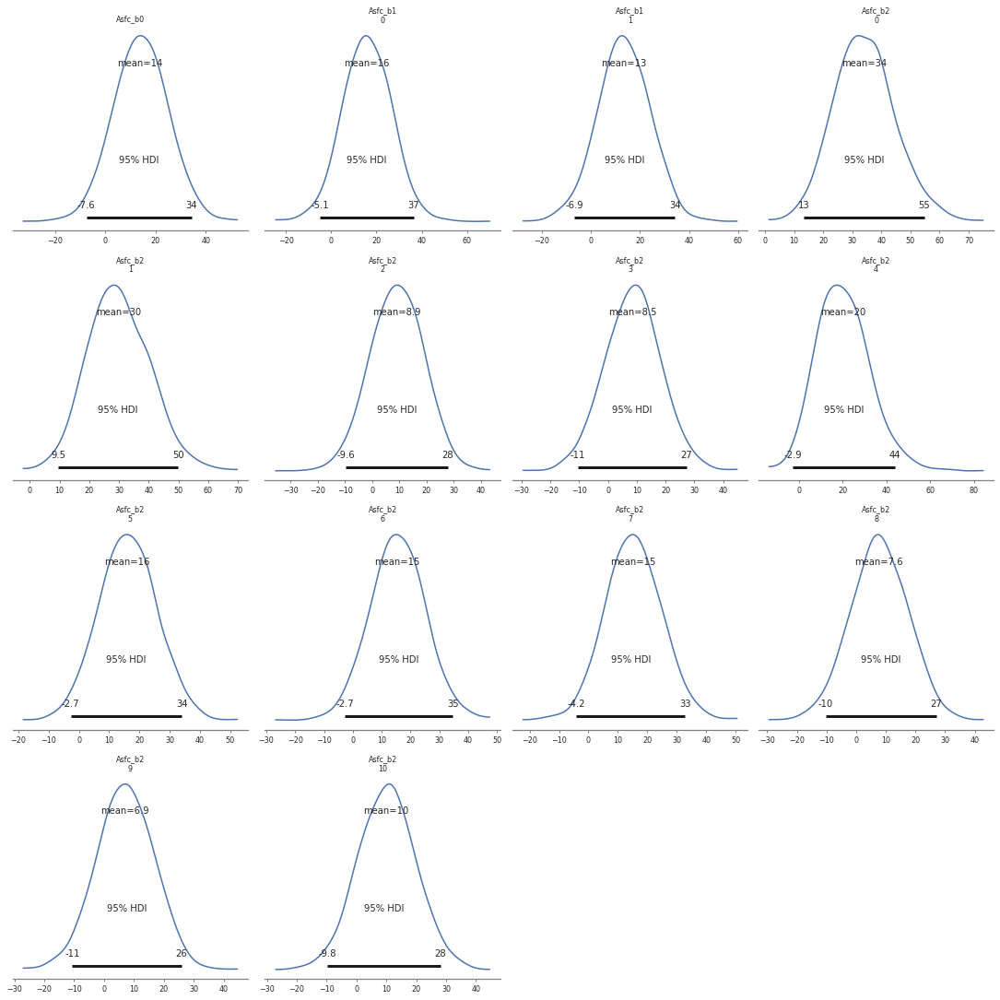

In [87]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_Asfc,'Asfc',prefix)

In [88]:
df_hdi_Asfc = plotting_lib.plotTreatmentPosterior(widthInch,heigthInch,dpi,sizes,writeOut,\
                                                  outPathPlots,dictMeanStd,dictTreatment,dictSoftware,\
                                                  trace_Asfc,'Asfc',x1,x2,prefix)

In [89]:
df_hdi_Asfc

,Treatment_i,Treatment_j,hdi_ConfoMap_2.5%,hdi_ConfoMap_97.5%,isSignificant_on_ConfoMap,hdi_Toothfrax_2.5%,hdi_Toothfrax_97.5%,isSignificant_on_Toothfrax
0,Dry grass,Dry bamboo,-3.916452,2.795973,False,-4.296147,1.377498,False
1,Dry lucerne,Dry bamboo,-4.260454,1.899807,False,-4.704579,0.667324,False
2,Dry lucerne,Dry grass,-2.615826,1.717622,False,-2.195671,1.343382,False
3,BrushNoDirt,BrushDirt,-15.010884,3.380206,False,-13.605707,4.419980,False
4,Control,BrushDirt,-35.731852,4.275047,False,-31.670087,3.675433,False
5,Control,BrushNoDirt,-34.009450,14.409722,False,-30.388298,13.091720,False
6,RubDirt,BrushDirt,-42.757337,-32.042331,True,-35.972142,-23.722769,True
7,RubDirt,BrushNoDirt,-42.529481,-21.978611,True,-36.265074,-14.506282,True
8,RubDirt,Control,-43.365126,-0.792099,True,-36.453023,2.421650,False
9,Clover+dust,Clover,-4.429319,2.363512,False,-4.325436,2.025695,False


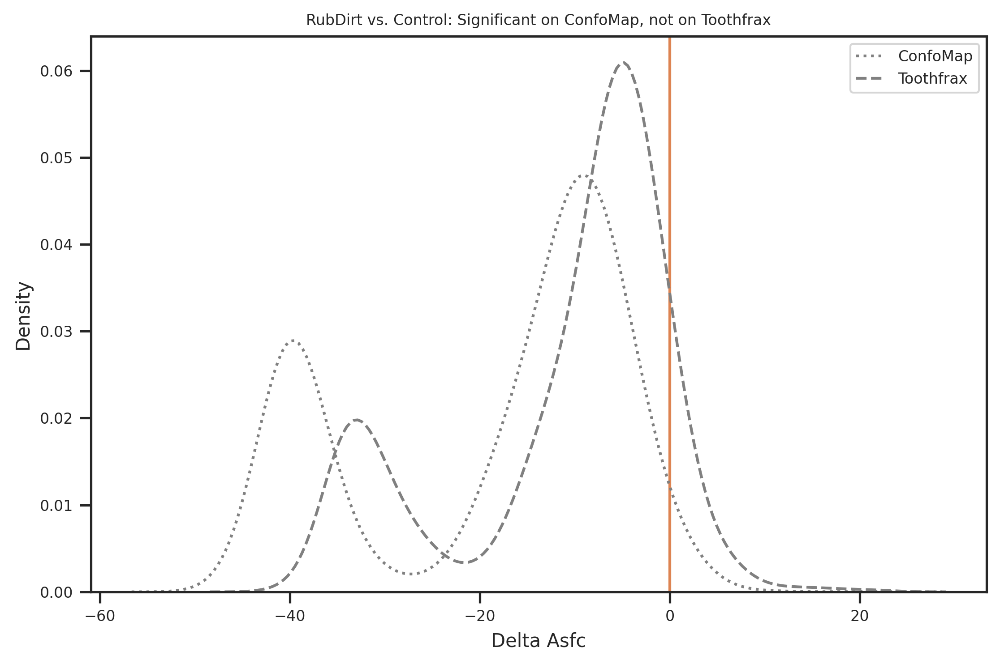

In [90]:
plotting_lib.plotTreatmentPosteriorDiff(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                        dictTreatment,dictSoftware,trace_Asfc,'Asfc',x1,x2,prefix)

In [91]:
if writeOut:
    df_hdi_Asfc.to_csv(outPathData+ '{}_hdi_{}.csv'.format(prefix,'Asfc'))

### 	Smfc  <a name="Smfc"></a>

In [92]:
with pm.Model() as model:
    SmfcModel = TwoFactorModel('Smfc',x1,x2,dataZ.Smfc_z.values)

#### Verify model settings

In [93]:
SmfcModel.printParams(x1,x2,dataZ.Smfc_z.values)

The number of levels of the x variables are (2, 11)
The standard deviations used for the beta priors are  (1.2903046708375803, 3.554940942907768)
The standard deviations used for the M12 priors are 0.18909317313924404


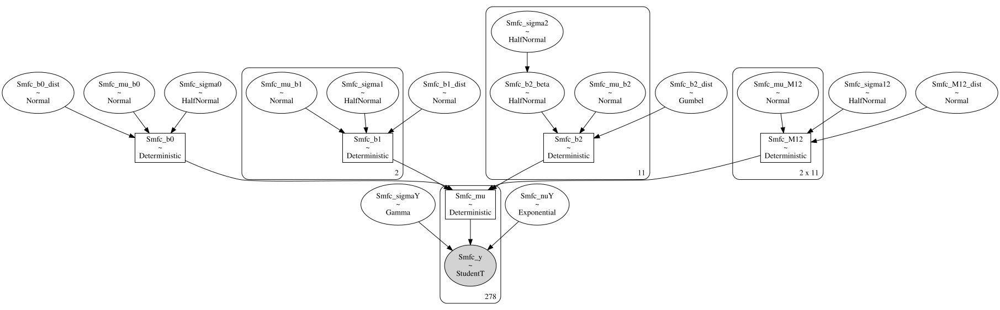

In [94]:
pm.model_to_graphviz(SmfcModel)

#### Check prior choice

In [95]:
with SmfcModel as model:
    prior_pred_Smfc = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

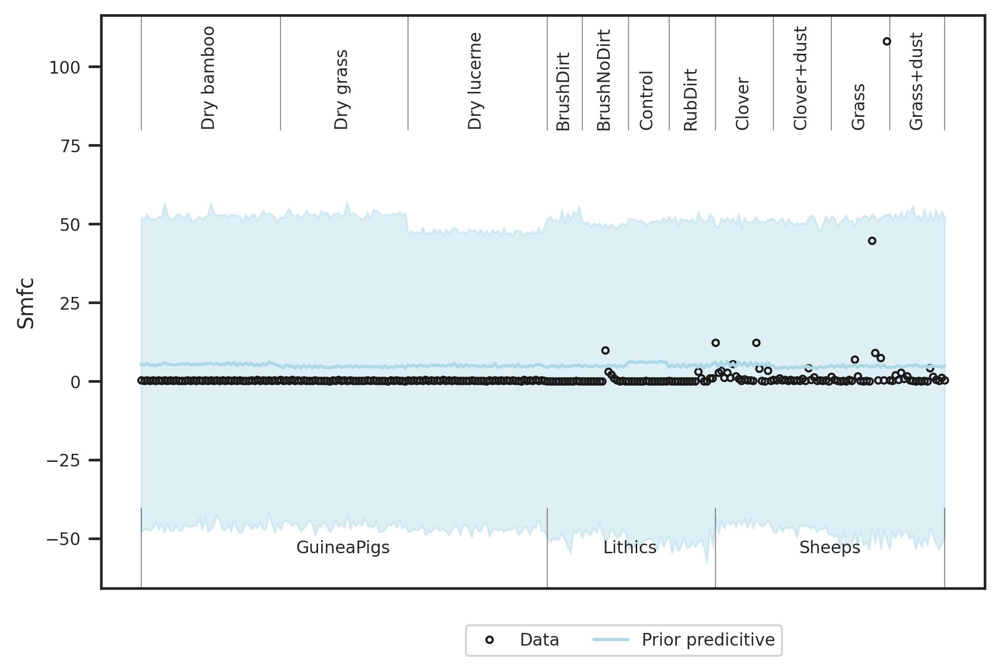

In [96]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                 prior_pred_Smfc,dataZ.Smfc_z.values,'Smfc',prefix)

Prior choice is as intended: Broad over the data range.

#### Sampling

In [97]:
with SmfcModel as model:
    trace_Smfc = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=0.99,random_seed=random_seed)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Smfc_M12_dist, Smfc_mu_M12, Smfc_b2_dist, Smfc_b2_beta, Smfc_b1_dist, Smfc_b0_dist, Smfc_sigmaY, Smfc_nuY, Smfc_sigma12, Smfc_mu_b2, Smfc_mu_b1, Smfc_mu_b0, Smfc_sigma2, Smfc_sigma1, Smfc_sigma0]


ValueError: Not enough samples to build a trace.

Analysis stopped here because sampling did not converge.
As the plot shows, some data points are very far away from the others, which would require the analysis to be based on more heavy-tailed distributions.

### HAsfc9 <a name="HAsfc9"></a>

In [98]:
with pm.Model() as model:
    HAsfc9Model = TwoFactorModel('HAsfc9',x1,x2,dataZ["HAsfc9_z"].values)

#### Verify model settings

In [99]:
HAsfc9Model.printParams(x1,x2,dataZ["HAsfc9_z"].values)

The number of levels of the x variables are (2, 11)
The standard deviations used for the beta priors are  (1.2742199511468122, 3.5115369692183998)
The standard deviations used for the M12 priors are 0.18677880213027476


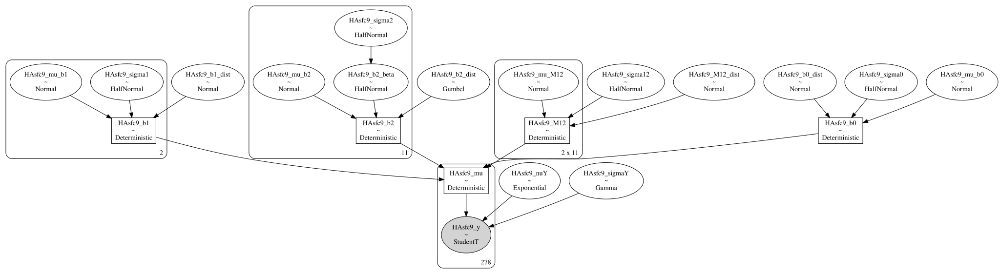

In [100]:
pm.model_to_graphviz(HAsfc9Model)

#### Check prior choice

In [101]:
with HAsfc9Model as model:
    prior_pred_HAsfc9 = pm.sample_prior_predictive(samples=numPredSamples,random_seed=random_seed)

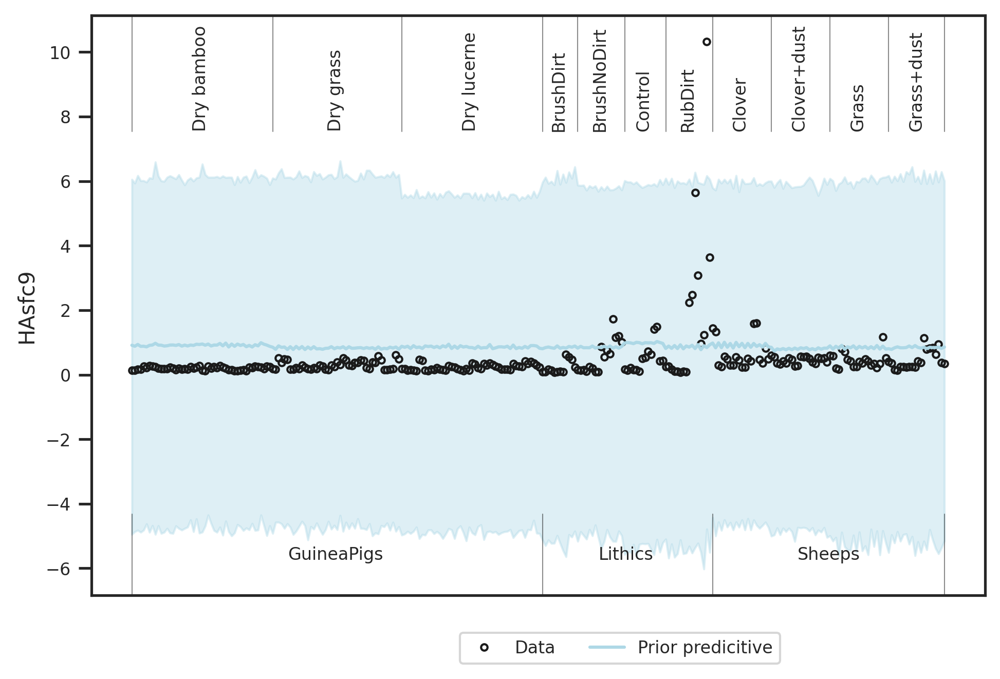

In [102]:
plotting_lib.plotPriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                 prior_pred_HAsfc9,dataZ["HAsfc9_z"].values,'HAsfc9',prefix)

Prior choice is as intended: Broad over the data range.

#### Sampling

In [103]:
with HAsfc9Model as model:
    trace_HAsfc9 = pm.sample(numSamples,cores=numCores,tune=numTune,max_treedepth=20, init='auto',target_accept=0.99,random_seed=random_seed)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [HAsfc9_M12_dist, HAsfc9_mu_M12, HAsfc9_b2_dist, HAsfc9_b2_beta, HAsfc9_b1_dist, HAsfc9_b0_dist, HAsfc9_sigmaY, HAsfc9_nuY, HAsfc9_sigma12, HAsfc9_mu_b2, HAsfc9_mu_b1, HAsfc9_mu_b0, HAsfc9_sigma2, HAsfc9_sigma1, HAsfc9_sigma0]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 892 seconds.


In [104]:
with HAsfc9Model as model:
    if writeOut:
        with open(outPathData + '{}_model_{}.pkl'.format(prefix,'HAsfc9'), 'wb') as buff:
            pickle.dump({'model': HAsfc9Model, 'trace': trace_HAsfc9}, buff)

#### Check sampling

In [105]:
with HAsfc9Model as model:
    dataTrace_HAsfc9 = az.from_pymc3(trace=trace_HAsfc9)

In [106]:
pm.summary(dataTrace_HAsfc9,hdi_prob=0.95).round(2)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
HAsfc9_mu_b0,-0.06,0.84,-1.81,1.49,0.01,0.01,4513.0,1991.0,4527.0,2921.0,1.0
HAsfc9_mu_b1[0],-0.01,0.74,-1.39,1.48,0.01,0.01,3933.0,2226.0,3929.0,2942.0,1.0
HAsfc9_mu_b1[1],-0.04,0.74,-1.51,1.42,0.01,0.01,4126.0,2501.0,4125.0,3332.0,1.0
HAsfc9_mu_b2[0],-0.13,0.66,-1.46,1.15,0.01,0.01,3202.0,2835.0,3195.0,3082.0,1.0
HAsfc9_mu_b2[1],-0.07,0.67,-1.38,1.21,0.01,0.01,3094.0,2469.0,3090.0,3108.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
HAsfc9_mu[273],-0.18,0.06,-0.28,-0.06,0.00,0.00,4055.0,3970.0,4041.0,3683.0,1.0
HAsfc9_mu[274],-0.15,0.07,-0.29,-0.02,0.00,0.00,3918.0,3610.0,3927.0,3528.0,1.0
HAsfc9_mu[275],-0.18,0.06,-0.28,-0.06,0.00,0.00,4055.0,3970.0,4041.0,3683.0,1.0
HAsfc9_mu[276],-0.15,0.07,-0.29,-0.02,0.00,0.00,3918.0,3610.0,3927.0,3528.0,1.0


/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/pairplot.py:216: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  UserWarning,


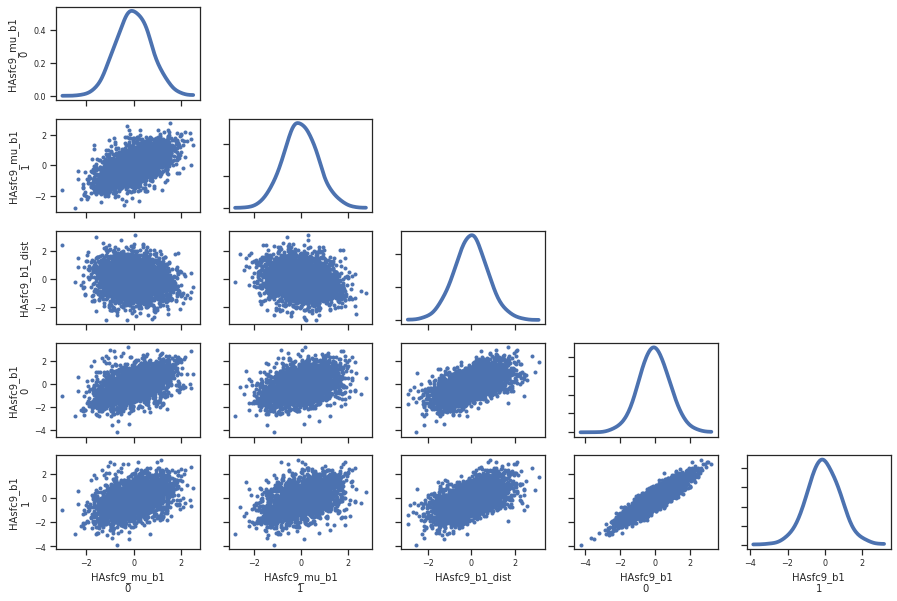

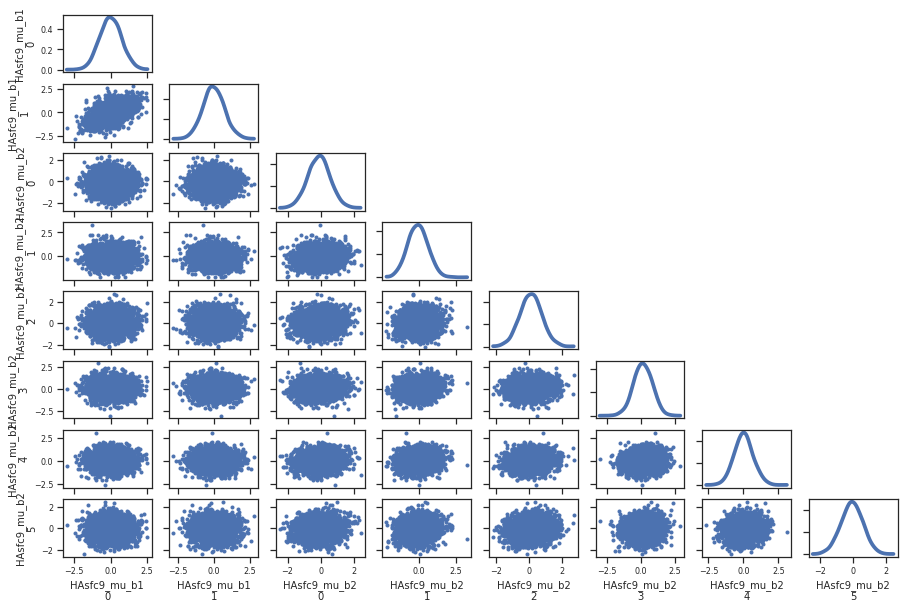

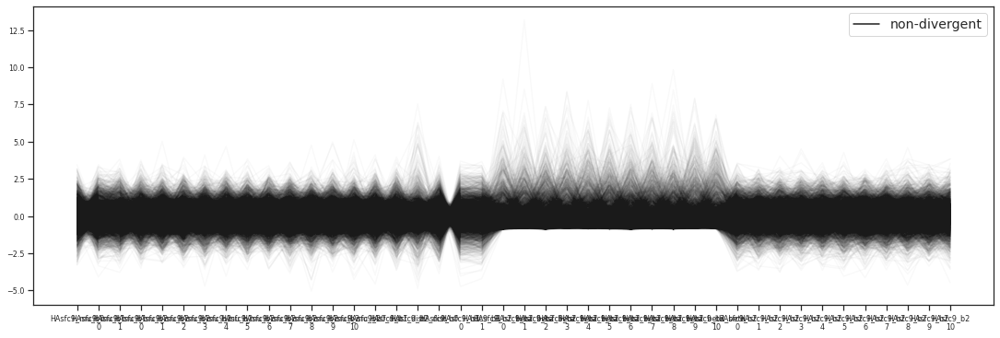

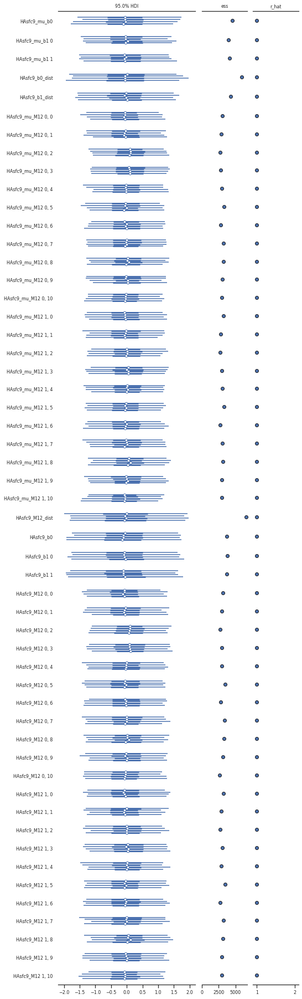

In [107]:
plotting_lib.plotDiagnostics(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_HAsfc9,\
                             dataTrace_HAsfc9,'HAsfc9',prefix)

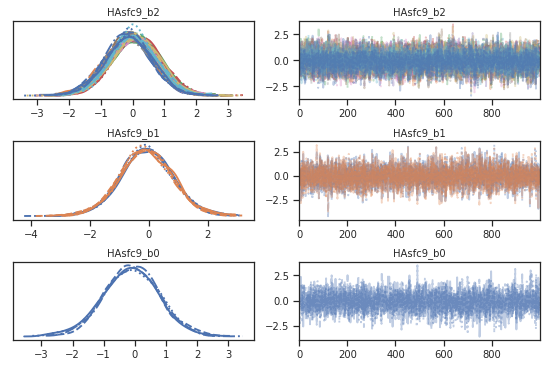

In [108]:
with HAsfc9Model as model:
    plotting_lib.plotTracesB(widthInch,heigthInch,dpi,writeOut,outPathPlots,trace_HAsfc9,'HAsfc9',prefix)

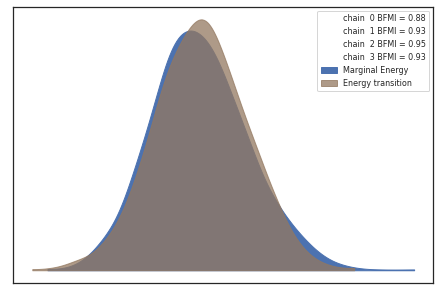

In [109]:
with HAsfc9Model as model:
    plotting_lib.pm.energyplot(trace_HAsfc9)

#### Posterior predictive distribution

In [110]:
with HAsfc9Model as model:
    posterior_pred_HAsfc9 = pm.sample_posterior_predictive(trace_HAsfc9,samples=numPredSamples,random_seed=random_seed)

/home/bob/Documents/Projekt_Neuwied/SSFA/ssfa-env/lib/python3.7/site-packages/pymc3/sampling.py:1708: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


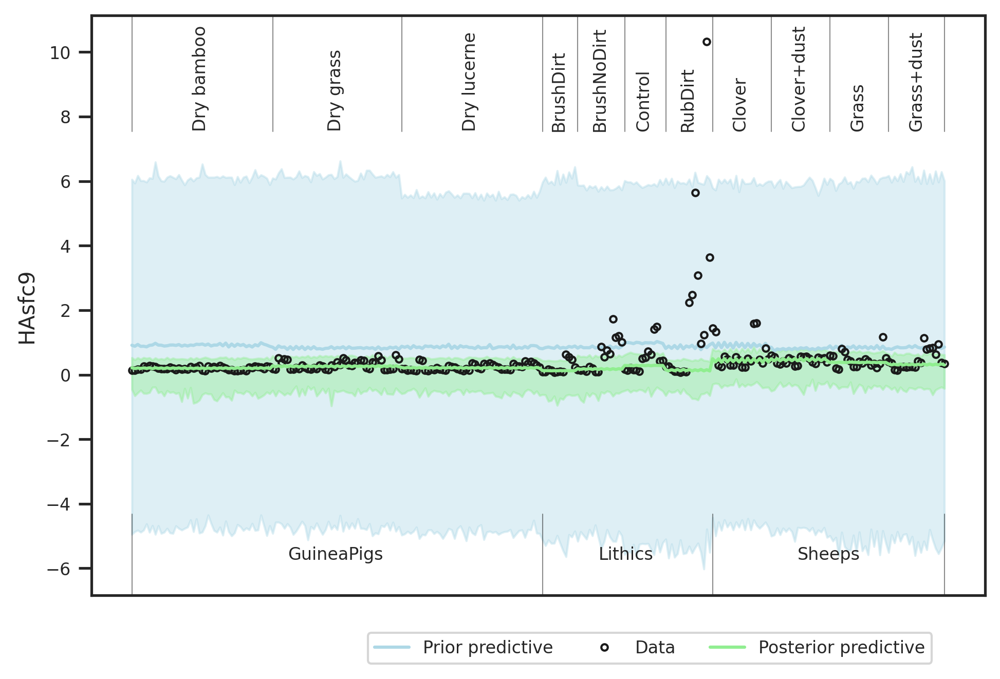

In [111]:
plotting_lib.plotPriorPosteriorPredictive(widthInch,heigthInch,dpi,writeOut,outPathPlots,df,dictMeanStd,\
                                          prior_pred_HAsfc9,posterior_pred_HAsfc9,dataZ["HAsfc9_z"].values,\
                                          'HAsfc9',prefix)

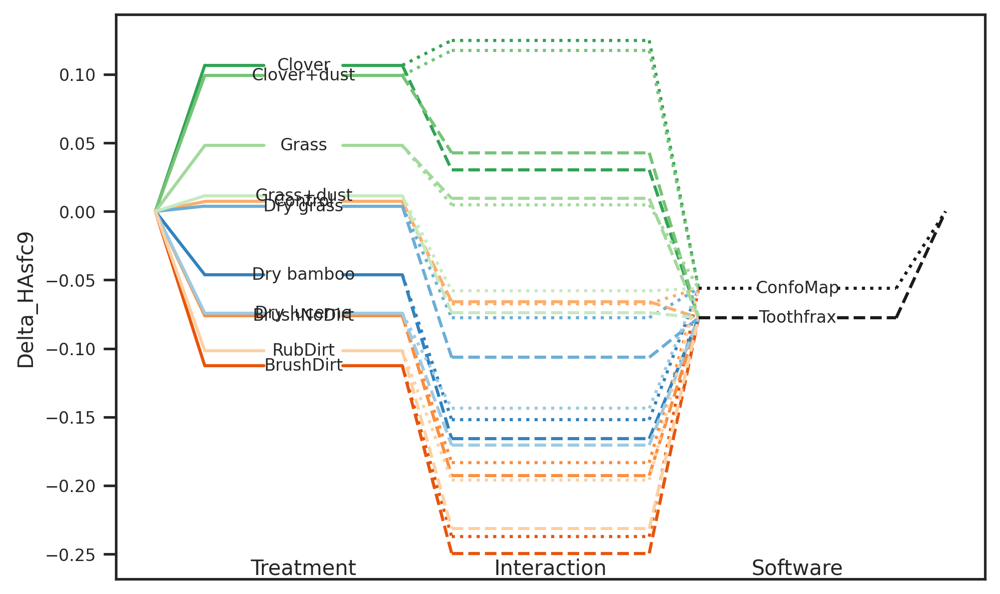

In [112]:
plotting_lib.plotLevels(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,dictTreatment,\
                        dictSoftware,trace_HAsfc9,'HAsfc9',x1,x2)

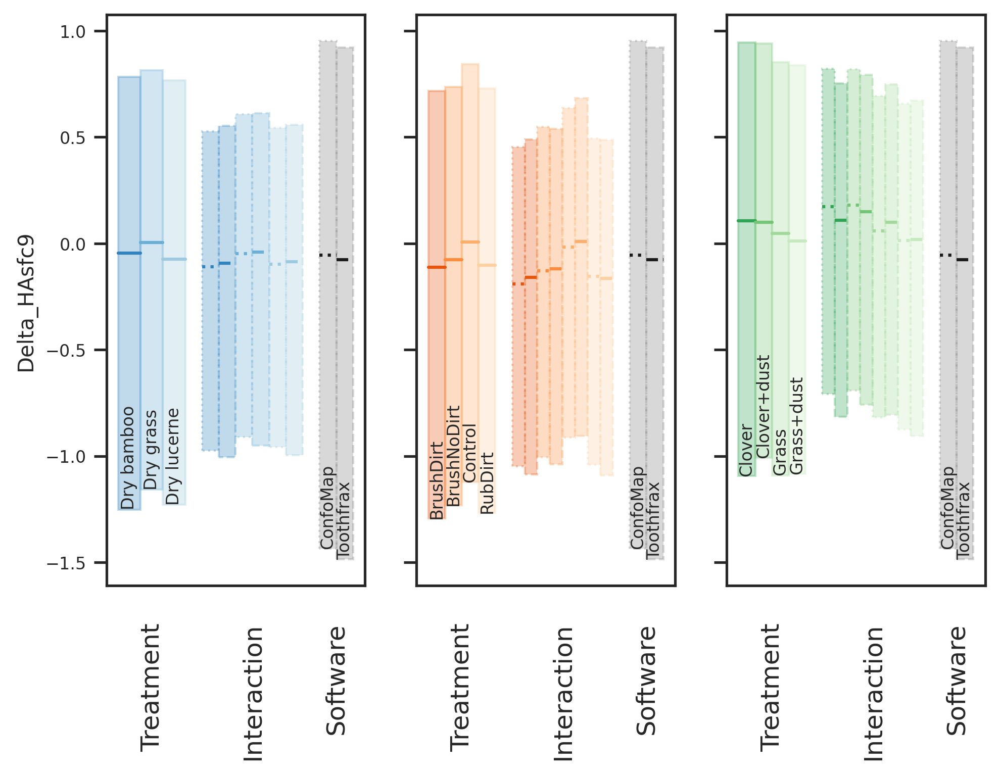

In [113]:
plotting_lib.plotLevelsStd(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,dictTreatment,\
                           dictSoftware,trace_HAsfc9,'HAsfc9',x1,x2)

#### Compare prior and posterior for model parameters

In [114]:
with HAsfc9Model as model:
    pm_data_HAsfc9 = az.from_pymc3(trace=trace_HAsfc9,prior=prior_pred_HAsfc9,posterior_predictive=posterior_pred_HAsfc9)

arviz.data.io_pymc3 - WARNING - posterior predictive variable HAsfc9_y's shape not compatible with number of chains and draws. This can mean that some draws or even whole chains are not represented.


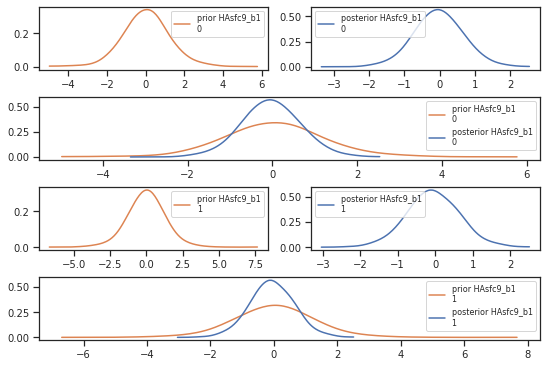

In [115]:
plotting_lib.plotPriorPosteriorB(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                 pm_data_HAsfc9,'HAsfc9',prefix)

#### Posterior and contrasts

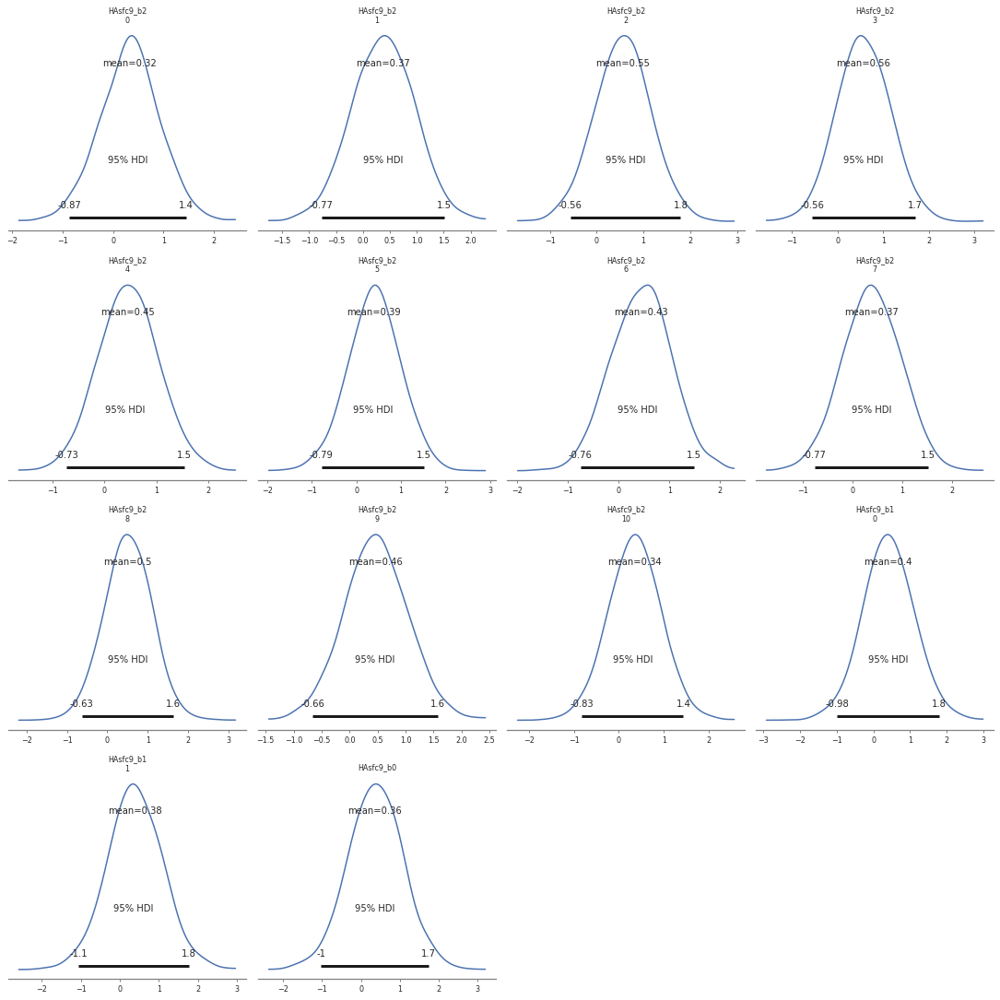

In [116]:
plotting_lib.plotPosterior(widthInch,heigthInch,dpi,writeOut,outPathPlots,dictMeanStd,pm_data_HAsfc9,'HAsfc9',prefix)

In [117]:
df_hdi_HAsfc9 = plotting_lib.plotTreatmentPosterior(widthInch,heigthInch,dpi,sizes,writeOut,\
                                                    outPathPlots,dictMeanStd,dictTreatment,dictSoftware,\
                                                    trace_HAsfc9,'HAsfc9',x1,x2,prefix)

In [118]:
df_hdi_HAsfc9

,Treatment_i,Treatment_j,hdi_ConfoMap_2.5%,hdi_ConfoMap_97.5%,isSignificant_on_ConfoMap,hdi_Toothfrax_2.5%,hdi_Toothfrax_97.5%,isSignificant_on_Toothfrax
0,Dry grass,Dry bamboo,-0.010268,0.143011,False,-0.010625,0.126663,False
1,Dry lucerne,Dry bamboo,-0.049642,0.073424,False,-0.043776,0.064924,False
2,Dry lucerne,Dry grass,-0.133646,0.031096,False,-0.122211,0.028118,False
3,BrushNoDirt,BrushDirt,-0.125128,0.238569,False,-0.140860,0.229987,False
4,Control,BrushDirt,-0.020567,0.415332,False,-0.066013,0.448612,False
5,Control,BrushNoDirt,-0.120627,0.368658,False,-0.139664,0.449018,False
6,RubDirt,BrushDirt,-0.106453,0.178762,False,-0.142743,0.149182,False
7,RubDirt,BrushNoDirt,-0.209790,0.142115,False,-0.242017,0.174436,False
8,RubDirt,Control,-0.368504,0.063584,False,-0.482366,0.066704,False
9,Clover+dust,Clover,-0.132341,0.158945,False,-0.086217,0.173111,False


In [119]:
if writeOut:
    df_hdi_HAsfc9.to_csv(outPathData+ '{}_hdi_{}.csv'.format(prefix,'HAsfc9'))

In [120]:
plotting_lib.plotTreatmentPosteriorDiff(widthInch,heigthInch,dpi,sizes,writeOut,outPathPlots,dictMeanStd,\
                                        dictTreatment,dictSoftware,trace_HAsfc9,'HAsfc9',x1,x2,prefix)

## Summary<a name="summary"></a>

Set the surface parameters for every treatment dataframe:

In [121]:
df_hdi_Asfc["SurfaceParameter"] = "Asfc"
df_hdi_HAsfc9["SurfaceParameter"] = "HAsfc9"
df_hdi_R["SurfaceParameter"] = "R²"
df_hdi_epLsar["SurfaceParameter"] = "epLsar"

In [122]:
df_hdi_total = pd.concat([df_hdi_epLsar,df_hdi_R,df_hdi_Asfc,df_hdi_HAsfc9],ignore_index=True)

Show the treatment pairs and surface parameters where the softwares differ

In [123]:
df_summary = df_hdi_total[df_hdi_total.isSignificant_on_ConfoMap != df_hdi_total.isSignificant_on_Toothfrax][["Treatment_i","Treatment_j","SurfaceParameter","isSignificant_on_ConfoMap","isSignificant_on_Toothfrax","hdi_ConfoMap_2.5%","hdi_ConfoMap_97.5%","hdi_Toothfrax_2.5%","hdi_Toothfrax_97.5%"]]
df_summary

,Treatment_i,Treatment_j,SurfaceParameter,isSignificant_on_ConfoMap,isSignificant_on_Toothfrax,hdi_ConfoMap_2.5%,hdi_ConfoMap_97.5%,hdi_Toothfrax_2.5%,hdi_Toothfrax_97.5%
2,Dry lucerne,Dry grass,epLsar,True,False,0.000057,0.001571,-0.000323,0.001235
11,Grass,Clover+dust,epLsar,False,True,-0.000229,0.002855,0.000049,0.003324
15,Dry grass,Dry bamboo,R²,True,False,0.000659,0.001970,-0.000351,0.000253
16,Dry lucerne,Dry bamboo,R²,True,False,0.000067,0.001447,-0.000407,0.000144
26,Grass,Clover+dust,R²,False,True,-0.000710,0.000560,-0.000889,-0.000103
38,RubDirt,Control,Asfc,True,False,-43.365126,-0.792099,-36.453023,2.421650


In [124]:
if writeOut:
    df_summary.to_csv(outPathData+ 'TwoFactor_summary_filter_weak.csv')

### Write out

In [125]:
!jupyter nbconvert --to html Statistical_Model_TwoFactor_filter_weak.ipynb

[NbConvertApp] Converting notebook Statistical_Model_TwoFactor_filter_weak.ipynb to html
[NbConvertApp] Writing 20324612 bytes to Statistical_Model_TwoFactor_filter_weak.html


In [126]:
!jupyter nbconvert --to markdown Statistical_Model_TwoFactor_filter_weak.ipynb

[NbConvertApp] Converting notebook Statistical_Model_TwoFactor_filter_weak.ipynb to markdown
[NbConvertApp] Support files will be in Statistical_Model_TwoFactor_filter_weak_files/
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statistical_Model_TwoFactor_filter_weak_files
[NbConvertApp] Making directory Statisti